**Students' name :**

Julien Erbland (SCIPER : 346893)

Max Henrotin (SCIPER :341463)

This aim of this course is to review the evolution of image processing tools, from basics to deep learning algorithms. The semester is split into four labs :

* **Lab 1** : Introduction to Image Processing
* **Lab 2** : Object detection
* **Lab 3** : Object tracking
* **Lab 4** : Introduction to Deep Learning 


Let's start with the first chapter of this course!

# Chapter 1 : Introduction to Image Processing

(100 points)


In [1]:
import cv2 as cv
import numpy as np
import os
import math
from utils import *
import matplotlib.pyplot as plt
%matplotlib inline

## 1.1 Introduction to Basic Image Processing Using OpenCV and NumPy

(20 points)

In this section we start with the basic image processing in Python.

**Goals:**

1. Read an image, access and modify pixel values
2. Change color space
3. Understand the concepts of histogram and histogram equalization


### 1.1.1 Read an image, access and modify pixel values

The code in the next section shows how you can load an image into the Jupyter notebook. 

In [2]:
# reading an image
img = cv.imread(os.path.join('.', 'data', 'matterhorn.jpg'))
print('Image has dimensions: {}'.format(img.shape))
print('There is a total of {} elements'.format(img.size))

Image has dimensions: (339, 509, 3)
There is a total of 517653 elements


OpenCV loads the image in a type of variable called a NumPy array. Elements of a NumPy array are accessed through indexing with the operator `[.]` where `.` indicates which dimensions you're accessing. The dimensions are organized as follows: `rows, cols, channels`. More information about indexing in NumPy is in the [doc](https://docs.scipy.org/doc/numpy/reference/arrays.indexing.html).

**QUESTION:** (/2)
- What do `rows, cols, channels` represent in the image? 
- What is the value of channels for grayscale and colored image? 
- Is the `matterhorn.jpg` image a grayscale or color image? Why? 
- What is the meaning of each channel when the image is loaded with OpenCV ([Hint](https://docs.opencv.org/4.x/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56))



**YOUR ANSWER :** 

**1. What do rows, cols, and channels represent in the image?**
* **Rows:** These represent the **height** of the image (the number of horizontal lines of pixels).
* **Cols (Columns):** These represent the **width** of the image (the number of vertical lines of pixels).
* **Channels:** These represent the **depth** of the image, usually the number of color components stored for each pixel (for example RGB).

**2. What is the value of channels for grayscale and colored images?**
* **Grayscale Image:** **1 channel**. It only stores a single intensity value for each pixel.
* **Colored Image:** **3 channels**. It stores three separate colors (usually RGB for Red, Green, Blue) to reconstruct a full-color image.

**3. Is the `matterhorn.jpg` image a grayscale or color image? Why?**
It is a **color image** since the NumPy array has a shape of `(rows, cols, 3)`. The presence of the value `3` in the third dimension of the array shows that it contains three color channels.

**4. What is the meaning of each channel when the image is loaded with OpenCV?**
OpenCV uses **BGR** (Blue-Green-Red) color space. This means the indices in the third dimension represent:
* **Index 0:** Blue channel
* **Index 1:** Green channel
* **Index 2:** Red channel

In the next cell we display the image using the provided function `display_image()` in file `utils.py`.

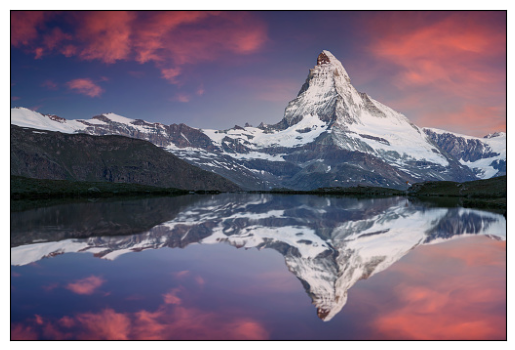

In [3]:
# Image can be displayed like this
display_image(img)
plt.show()

Now that you have an image loaded in the notebook, let's extract some properties from it. Here is how you can access a pixel or a region of the image, and modify a pixel value. 

In [4]:
pixel_row = 10 
pixel_col = 10

# accessing pixel (pixel_x, pixel_y) 
print('Pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))

# accessing region of the image starting at(pixel_row, pixel_col)
region_size = 10 
img_region = img[pixel_row:pixel_row+region_size, pixel_col:pixel_col+region_size]
print('Region size is {}'.format(img_region.shape))

# modifying pixel value
img[pixel_row, pixel_col] = [0, 0, 0]
print('New pixel value at location {}x{} is {}'.format(pixel_row, pixel_col, img[pixel_row, pixel_col]))


Pixel value at location 10x10 is [63 39 87]
Region size is (10, 10, 3)
New pixel value at location 10x10 is [0 0 0]


**QUESTION:** (/1)

In the next cell, change the color of the pixels to white in a rectangle of size (40, 100) starting from the pixel (30, 60) and show the new image.

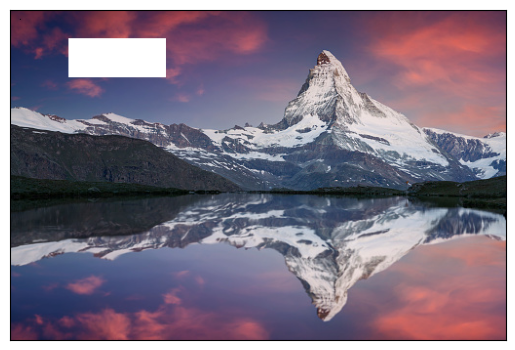

In [5]:
# modifying pixel value

## YOUR CODE HERE
row_start, col_start = 30, 60
height, width = 40, 100
row_end = row_start + height
col_end = col_start + width

img[row_start:row_end, col_start:col_end] = [255, 255, 255]

# Display the modified image with white rectangle
display_image(img)

### 1.1.2 Colorspace Conversion

Now, you will learn how to convert images from one colorspace to another, like BGR ↔ Gray, BGR ↔ YUV etc. There are more than 150 color-space conversion methods available in OpenCV. 

**QUESTION:** (/4)

In the next two cells, implements the conversion function going from BGR image to GRAY image and BGR to YUV image. There are built-in functions in OpenCV doing exactly that but for the moment we'll ask you to implement your **own** function in order to get the idea of what is happening under the hood.

In [6]:
def convert_bgr_to_grayscale(frame):
    """
    Convert a given bgr image into grayscale image
    :param frame: Color image to convert
    :return: Grayscale image as numpy array
    """
    
    # YOUR CODE HERE   

    B = frame[:, :, 0].astype(np.float32)
    G = frame[:, :, 1].astype(np.float32)
    R = frame[:, :, 2].astype(np.float32)

    # ITU-R BT.601 standard weighted formula for luminance
    image = 0.114 * B + 0.587 * G + 0.299 * R
    
    return image.astype(np.float32)

In [7]:
def convert_bgr_to_yuv(frame):
    """
    Convert a given BGR image into YUV image
    :param frame: Color image to convert
    :return: YUV image as numpy array
    """
    
    # YOUR CODE HERE
    # Split the channels
    B = frame[:, :, 0].astype(np.float32)
    G = frame[:, :, 1].astype(np.float32)
    R = frame[:, :, 2].astype(np.float32)

    # Conversion formulas (https://stackoverflow.com/questions/1737726/how-to-perform-rgb-yuv-conversion-in-c-c/1737741#1737741)
    Y = 0.299 * R + 0.587 * G + 0.114 * B
    U = -0.147 * R - 0.289 * G + 0.436 * B + 128
    V = 0.615 * R - 0.515 * G - 0.100 * B + 128
    image = np.stack([Y, U, V], axis=2)
    
    return image.astype(np.uint8)

The following lines shows the conversion based on your implementation and the built-in function from OpenCV. If everything went well, the two should match.

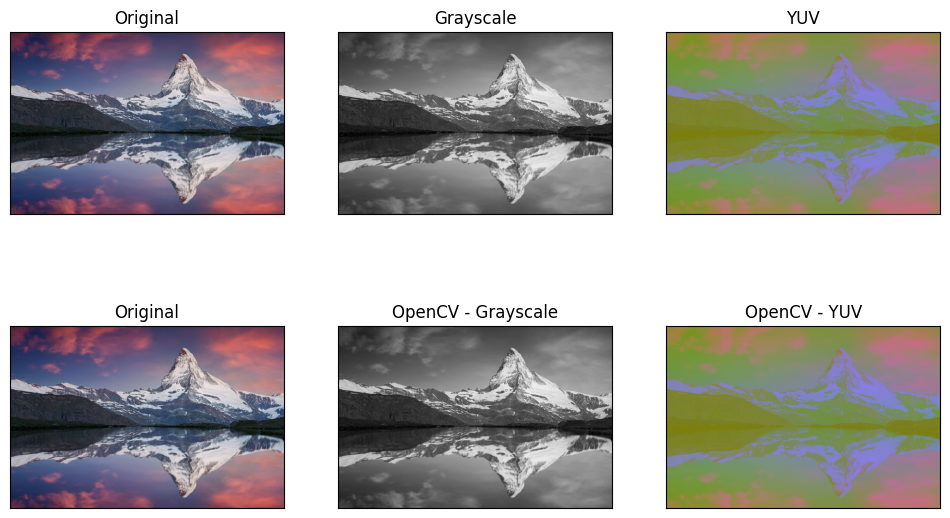

In [8]:
# Load image
img = cv.imread(os.path.join('.', 'data', 'matterhorn.jpg'))
# convert to gray + hsv
img_gray = convert_bgr_to_grayscale(img)
img_yuv = convert_bgr_to_yuv(img)
gt_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gt_yuv = cv.cvtColor(img, cv.COLOR_BGR2YUV)
# Display
fig, ax = plt.subplots(2, 3, figsize=(12, 7))
display_image(img, axes=ax[0][0])
ax[0][0].set_title('Original')
display_image(img_gray, axes=ax[0][1])
ax[0][1].set_title('Grayscale')
display_image(img_yuv, axes=ax[0][2])
ax[0][2].set_title('YUV')

display_image(img, axes=ax[1][0])
ax[1][0].set_title('Original')
display_image(gt_gray, axes=ax[1][1])
ax[1][1].set_title('OpenCV - Grayscale')
display_image(gt_yuv, axes=ax[1][2])
ax[1][2].set_title('OpenCV - YUV');
plt.show()

Now you know how to convert *BGR* image to any color space, you can use this to extract a colored object. In *HSV*, it is more easier to represent a color than in *BGR* colorspace. Here is the method to extract a colored object:

1. Reading an input image
2. Convert from *BGR* to *HSV* color-space using bluit-in function from OpenCV
3. We threshold the *HSV* image to extract the pixels in the desired color range. 

**QUESTION:** (/2)

First, implement the function `threshold_bgr_image()` to threshold the color image in the desired color range. 

**Hint**: You may use the OpenCV functions `inRange()` and `bitwise_and()`.

In [9]:
def threshold_bgr_image(frame, lower, upper):
    """
    Segment image.
        1. Convert image to HSV color space
        2. Find pixels in the desired color range (lower, upper)
        3. Apply the mask to the image. 
    :param frame: BGR image to segment
    :param lower: Lower threshold value
    :param upper: Upper threshold value
    :return res: Segmented image
    :return mask: binary mask
    """
    #https://docs.opencv.org/4.x/df/d9d/tutorial_py_colorspaces.html
    #BGR to HSV
    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
    
    #Binary mask where pixels within range are white (255) and others are black (0)
    mask = cv.inRange(hsv, lower, upper)
    
    #Apply the mask
    res = cv.bitwise_and(frame, frame, mask=mask)
    
    return res, mask

The next cell test your function on the blue pixels of the image.

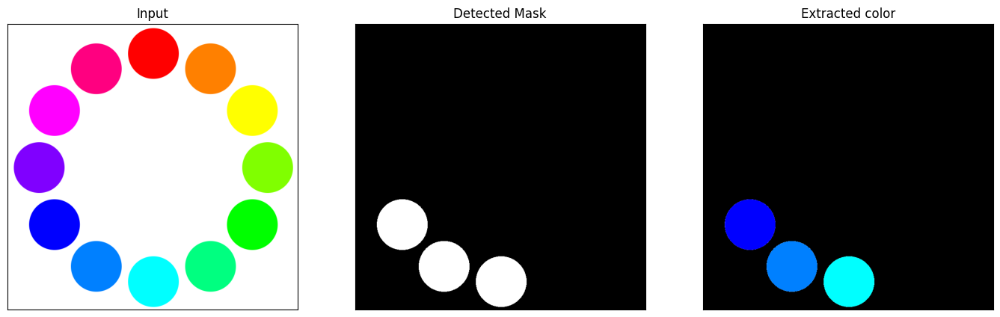

In [10]:
# 1. Read input
path = os.path.join('data', 'circles_color.png')
img = cv.imread(path)

# 2. Define range of blue color in HSV
lower = np.asarray([90,120,120])
upper = np.asarray([130,255,255])
im, mask = threshold_bgr_image(img, lower, upper)

# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color');
plt.show()

In order to find *HSV* values, you can use the same function, `cv.cvtColor()`. Instead of passing an image, you just pass the *BGR* values you want. The next cell shows an example to find the HSV value of red. 

In [11]:
red = np.uint8([[[0, 0, 255 ]]])
hsv_red = cv.cvtColor(red, cv.COLOR_BGR2HSV)
print( 'HSV component {}'.format(hsv_red))

HSV component [[[  0 255 255]]]


**QUESTION:** (/2)

Try to extract the **Yellow** circle. Comment and show the result.


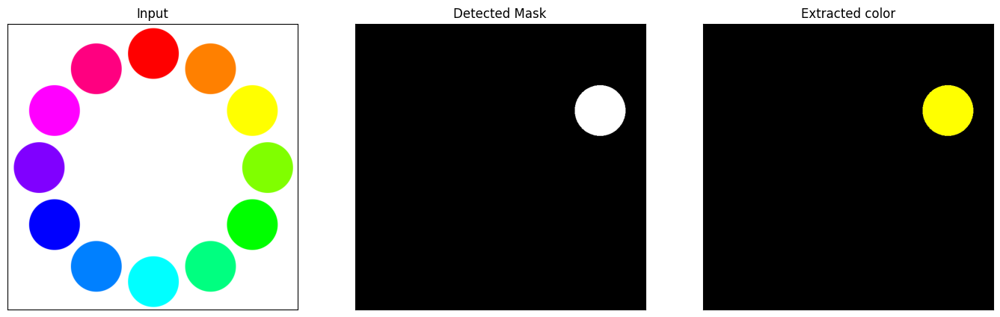

In [12]:
# 1. Read input
img = cv.imread(os.path.join('data', 'circles_color.png'))

# 2. Extract yellow color in HSV

### Your code here ### 
yellow = np.uint8([[[0, 255, 255]]])    #Yellow in BGR format
hsv_yellow = cv.cvtColor(yellow, cv.COLOR_BGR2HSV)

#This is if we only want to extract perfect yellow color (unused)
im_perfect, mask_perfect = threshold_bgr_image(img, hsv_yellow[0,0], hsv_yellow[0,0])

#to have a range for all types of yellow
hue = hsv_yellow[0, 0, 0] # Hue value for yellow color
lower = np.array([hue - 10, 120, 120])
upper = np.array([hue + 10, 255, 255])  
im, mask = threshold_bgr_image(img, lower, upper)

# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color')
plt.show()

**YOUR ANSWER :**

When attempting to extract the Yellow circle using the same Hue range as the Blue circle, the filter incorrectly includes parts of the Orange and Green objects. To address this, we reduced the error range to ±10 to include only the hue values of yellow. This occurs because applying a Hue error range of ±20, as what was done for blue, is too broad for the yellow spectrum. Yellow occupies a much narrower band on the Hue axis than Blue.
In addition we provided a simpler version : "im_perfect" and "mask_perfect" if we wanted to extract only perfect yellow.

So far you have been working with color image, but you could apply the same approach with the grayscale image.

**QUESTION:** (/2)

Now, try to extract the **yellow** pencil using the grayscale image. What are the pros and cons of each method (colors *vs* grayscale)?

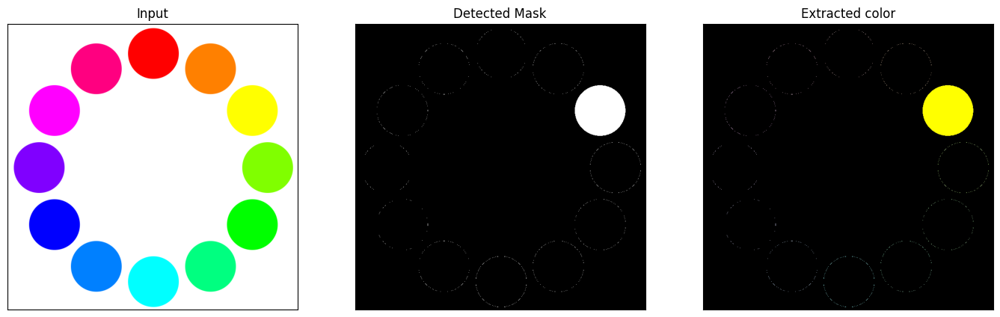

In [13]:
def threshold_gray_image(frame, lower, upper):
    """
    Segment image.
        1. Convert image to gray color space
        2. Find pixels in the desired color range (lower, upper)
        3. Apply the mask to the image. 
    :param frame: BGR image to segment
    :param lower: Lower threshold value
    :param upper: Upper threshold value
    :return: Segmented image, binary mask
    """
    
    # YOUR CODE HERE
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    mask = cv.inRange(gray, lower, upper)
    res = cv.bitwise_and(frame, frame, mask=mask)
    
    return res, mask

# 1. Read input
img = cv.imread(os.path.join('data', 'circles_color.png'))

# 2. Extract yellow color in gray


# YOUR CODE HERE
yellow = np.uint8([[[0, 255, 255]]])
gr_yellow = cv.cvtColor(yellow, cv.COLOR_BGR2GRAY)

lower = gr_yellow - 10
upper = gr_yellow + 10

im, mask = threshold_gray_image(img, lower, upper)
    
# 3. Display using subplots
fig, ax = plt.subplots(1, 3, figsize=(17, 9))
display_image(img, axes=ax[0])
ax[0].set_title('Input')
display_image(mask, axes=ax[1], cmap='gray')
ax[1].set_title('Detected Mask')
display_image(im, axes=ax[2])
ax[2].set_title('Extracted color')
plt.show()

**YOUR ANSWER**

* **Color (HSV)**
    * **Pros:** can be really specific and will be able to detect every color possible.
    * **Cons:** More complex to use since it is defined in three separate dimensions (H, S, and V).

* **Grayscale**
    * **Pros:** Simple and fast (only requires a single threshold value on one channel)
    * **Cons:** Low selectivity : it could for example not distinguish between a yellow object and some light gray object. In addition we lose some informations about intensity of the colour so a light blue could also have similar grayscale value (see example bellow)

In [14]:
yellow = np.uint8([[[0, 255, 255]]])
light_blue = np.uint8([[[255, 255, 158]]])
print(cv.cvtColor(yellow, cv.COLOR_BGR2GRAY))
print(cv.cvtColor(light_blue, cv.COLOR_BGR2GRAY))

[[226]]
[[226]]


### 1.1.3 Image Histogram

An histogram is a graph or plot, which gives you an overall idea about the intensity distribution of the pixels of the image. It is just another way of understanding the image. By looking at the histogram of an image, you get intuition about contrast, brightness, intensity distribution etc of that image. Almost all image processing tools today, provides features on histogram.

**QUESTION:** (/1)

In the next cell, implement a function using OpenCV that computes the image histogram for all channels.

In [15]:
def compute_image_histogram(image):
    """
    Compute image color distribution for each channels of a given `image`
    :param image: Image to extract histograms for
    :return: List of histogram, one per channel.
    """
    hist = []
    histSize = 256
    histRange = (0, 256) # the upper boundary is exclusive
    
    #Split the image into its planes
    bgr_planes = cv.split(image)
    
    #Loop through channels
    for i in range(len(bgr_planes)):
        channel_hist = cv.calcHist(bgr_planes, [i], None, [histSize], histRange, accumulate=False)
        hist.append(channel_hist)

    return hist

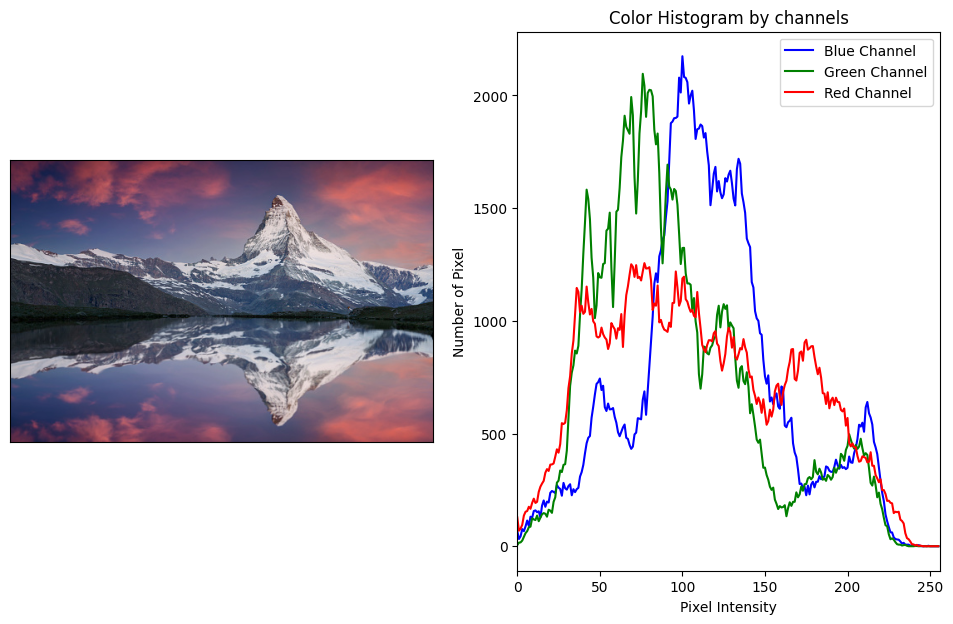

In [16]:
# 1. Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'))

# 2. Compute histogram for each channels
hists = compute_image_histogram(img)

# 3. Plot 
color = ['b', 'g', 'r']
fig, ax = plt.subplots(1, 2, figsize=(12, 7))
display_image(img, axes=ax[0])
for k, hist in enumerate(hists):
    ax[1].plot(hist, color=color[k])
ax[1].set_title('Color Histogram by channels')
ax[1].set_xlim([0, 256])
ax[1].set_xlabel('Pixel Intensity')
ax[1].set_ylabel('Number of Pixel')
plt.legend(['Blue Channel', 'Green Channel', 'Red Channel'])
plt.show()

You can see the image and the corresponding histograms.

**QUESTION:** (/1)

What is the significant of the pixel intensity?


**YOUR ANSWER** 

Pixel intensity represents the brightness level of a specific color at a single point in an image. It tells how much light to emit for every tiny dot in the picture. 
On our histogram we see that the green channel is concentrated in the lower intensities, reflecting its role in the darker shadows and mid-tones of the landscape. The blue channel shows a significant peak at higher intensities, confirming its dominance in the bright sky and lake reflections. In contrast, the red channel is broadly distributed across the entire spectrum. This wide range accounts for everything from the dark foreground shadows to the high-luminance highlights in the sunset clouds.

#### Histogram equalization
Consider an image whose pixel values are confined to some specific range of values only. For instance, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends and that is what Histogram Equalization does. This normally improves the contrast of the image ([doc](https://en.wikipedia.org/wiki/Histogram_equalization)).

**QUESTION:** (/3)

In the next section implement such contrast enhancement function (i.e. based on histogram equalization)

In [17]:
def contrast_enhancement(image):
    """
    Compute histogram and apply histogram equalization on a given image.
    :param image: Image to enhance contrast
    :return: tuple: enhanced image, input image histogram, transformed image histogram
    """
    
    # 1.Image Parameters
    L = 256  # Total gray levels
    n = image.size  # Total number of pixels
    
    # 2.Compute Original Histogram
    hist = compute_image_histogram(image)[0] 
    
    # 3.Compute Probability Density Function
    pdf = hist.flatten() / n
    
    # 4.Compute Cumulative Distribution Function
    cdf = np.cumsum(pdf)
    
    # 5.Create Transformation Look-up Table (LUT)
    # Standard formula: T(k) = floor((L-1) * CDF(k))
    transform_lut = np.floor((L - 1) * cdf).astype(np.uint8)
    
    # 6. Apply transformation
    # transform_lut[image] replaces every pixel value with its mapped value
    image_equ = transform_lut[image]
    
    # 7. Compute Transformed Histogram
    hist_equ = compute_image_histogram(image_equ)[0]
    
    return image_equ, hist, hist_equ

The next cell shows you the results of histogram equalization on an image. 

**QUESTION:** (/2)

- How has the contrast evolved after applying the transformation ? 
- How has the histogram changed ?

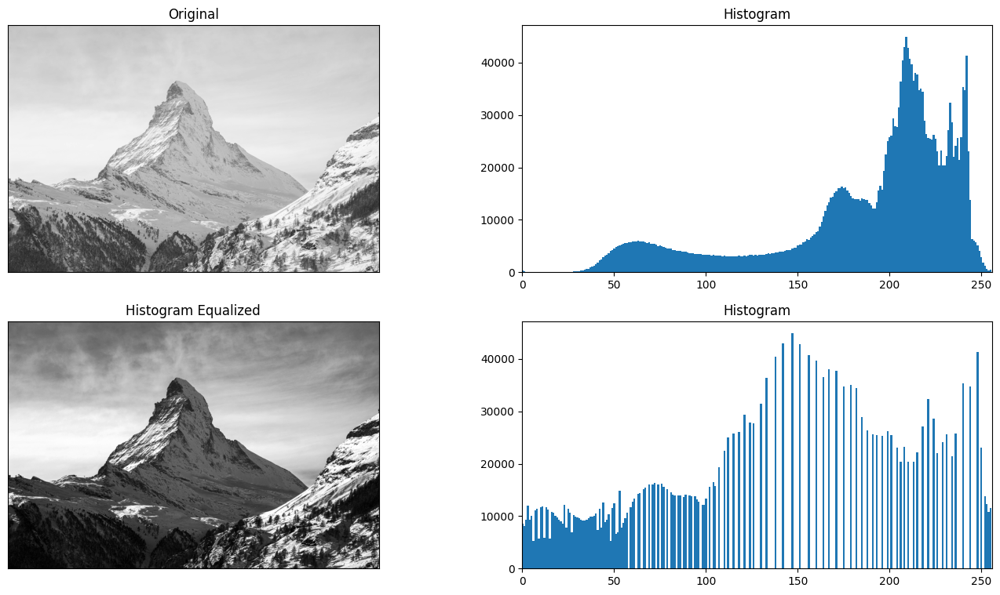

In [18]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn_snow.jpg'), cv.IMREAD_GRAYSCALE)

# Enhance contrast with histogram equalization
img_equ, hist, hist_equ = contrast_enhancement(img)

# Display
fig, ax = plt.subplots(2, 2, figsize=(17, 9))
display_image(img, axes=ax[0][0])
ax[0][0].set_title('Original')
# Histogram original
ax[0][1].bar(np.arange(hist.shape[0]), hist.reshape(-1),  width=1)
ax[0][1].set_xlim([0, 256])
ax[0][1].set_title('Histogram')
# Histogram equalized
display_image(img_equ, axes=ax[1][0])
ax[1][0].set_title('Histogram Equalized')
ax[1][1].bar(np.arange(hist_equ.shape[0]), hist_equ.reshape(-1),  width=1)
ax[1][1].set_xlim([0, 256])
ax[1][1].set_title('Histogram')
plt.show()


**YOUR ANSWER**

**How has the contrast evolved after applying the transformation ?**

After applying histogram equalization, the contrast significantly increases. Subtle differences in intensity that were previously indistinguishable are amplified.

**How has the histogram changed ?**

The "peaks" (in our case, high concentrations of pixels at high intensity) are spread out so the histogram is now "more flat" and has thus more pixels at lower intensities. In addition, because digital images have discrete values (integers 0-255), the resulting histogram is **not perfectly flat**: the equalization remaps intensity bins via the CDF, but since multiple source values can map to the same target value (quantisation effects), some target bins remain empty while others accumulate multiple source bins — creating the visible gaps in the transformed histogram.

### 1.2 Image filtering and edges detection

(50 points)

Image filtering is a two-dimensional convolution of the image by a small matrix called kernel. The choice of the kernel depends on the goal of the filtering operation, which can be noise removal, edge detection, contrast enhancement, etc. In general, filters are classified into two families: low-pass filters and high-pass filters. 
 
### 1.2.1 Low-pass filters 

The most common low-pass filters are the [averaging filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37), the [Gaussian filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1) and the [median filter](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9). 

**QUESTION:** (/3)

In the next cell, implement the function `apply_lowpass_filter()`, which takes as input an image, and the filter parameters in a dictionary (filter type and size) and returns the filtered image. Use the corresponding OpenCV functions. 


In [19]:
def apply_lowpass_filter(img, filter_params):
    """
    Apply a low-pass filter on a given image.
    :param img: Grayscale image to apply the filter to
    :param filter_params: Parameters of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE
    
    f_type = filter_params.get('ftype')
    k_size = filter_params.get('fsize')
    
    # Ensure kernel size is odd
    if k_size % 2 == 0:
        k_size += 1

    if f_type == 'averaging':
        # Simple box filter averaging
        img_filt = cv.blur(img, (k_size, k_size))
        
    elif f_type == 'gaussian':
        # Gaussian blurring (weights pixels based on a bell curve)
        # sigmaX=0 tells OpenCV to calculate sigma based on kernel size
        img_filt = cv.GaussianBlur(img, (k_size, k_size), 0)
        
    elif f_type == 'median':
        # Replaces pixel with the median of its neighbors
        img_filt = cv.medianBlur(img, k_size)
        
    else:
        raise ValueError(f"Filter type '{f_type}' is not supported.")

    return img_filt


The next cell tests your implementation on two images corrupted by a different noise, with a filter of size (7x7). 

**QUESTION:** (/2)

What is the effect of each filter? How different are the filtered images? Which filter is the best for each image and why? 

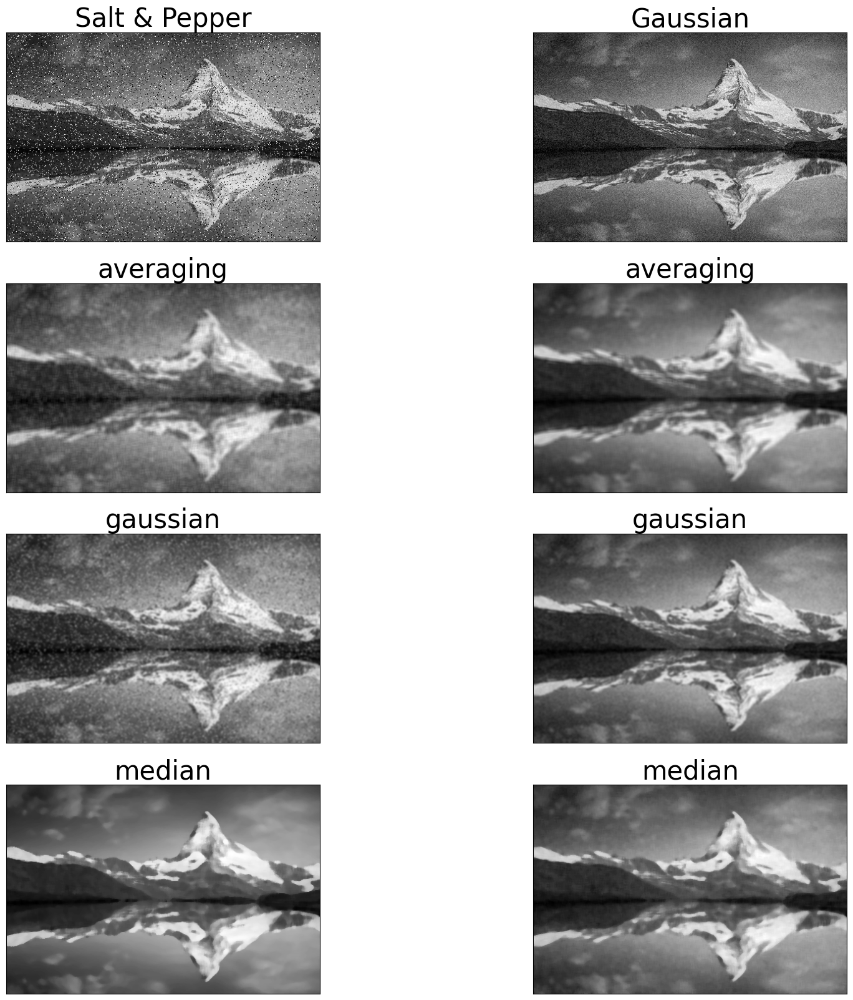

In [20]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE), cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]
img_title = ["Salt & Pepper", "Gaussian"]

# Filtering with a kernel of size 7x7
filter_size = 7 
filter_params = [ {"ftype":"averaging", "fsize":filter_size},
                 {"ftype":"gaussian", "fsize":filter_size},
                 {"ftype":"median", "fsize":filter_size}]


# Display image
fig, ax = plt.subplots(len(filter_params)+1, len(imgs), figsize=(20, 20))

for curr_img_idx, curr_img in enumerate(imgs):
    display_image(curr_img, axes=ax[0, curr_img_idx], cmap='gray')
    
    ax[0, curr_img_idx].set_title(img_title[curr_img_idx], fontsize=30)

    for curr_filt_idx, curr_filt in enumerate(filter_params):        
        img_filt = apply_lowpass_filter(curr_img, curr_filt)
        display_image(img_filt, axes=ax[curr_filt_idx+1, curr_img_idx], cmap='gray')
        ax[curr_filt_idx+1, curr_img_idx].set_title(curr_filt["ftype"], fontsize=30)
plt.show()


**YOUR ANSWER**

**What is the effect of each filter?**

- averaging: It takes the simple average of every pixels in the kernel (in our case, the 49 pixels in the 7×7 window around each pixel).
- It uses a weighted average where pixels closer to the center of the kernel have more influence, following a bell curve (Gaussian distribution).
- It sorts all 49 pixels and picks the middle value. It is non-linear

**How different are the filtered images?**

- averaging: It makes the whole image smoother like when we see underwater. It reduces noise but significantly blurs sharp edges and fine details (like the ridges of the Matterhorn).
- gaussian: It is better at preserving the overall structure of the image than the averaging filter while still reducing high-frequency grain. It is like a softer and more accurate version of averaging.
- median: It is extremely effective at removing "outliers" (pixels that are vastly different from their neighbors) without blurring the edges.

**Which filter is the best for each image and why?**
- Salt & Pepper: Median Filter is the best since here the noise consists of extreme values (0 or 255). Since these are outliers, they are almost never the "median" value of a neighborhood. The filter simply discards them, removing the noise completely while keeping the mountain edges sharp.
- Gaussian Noise: Gaussian Filter is the best since here the noise is more a random variation across all pixels. The Gaussian filter is mathematically designed to "smooth out" this specific distribution while preserving the subtle gradients of the sky and snow more accurately.

Now that you are able to filter an image, let's find the optimal kernel. In this question, we consider the optimal filter to be the one that produces a filtered image that is visually closest to the image without noise.

**QUESTION:** (/4)

For each image, propose an optimal kernel (type and size), justify your choice and show the filtered image. 

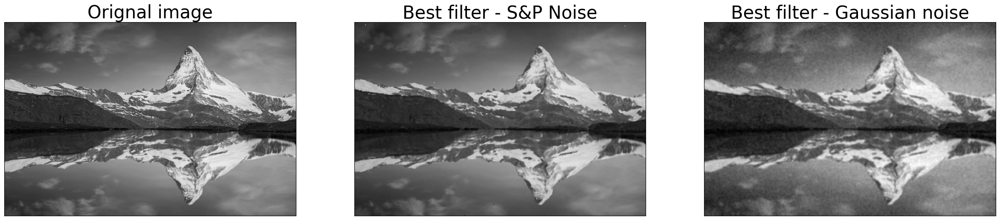

In [21]:
# Load image
img_orig = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE), cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]
img_title = ["Salt & Pepper", "Gaussian"]

# Best filter parameters


###################
# YOUR CODE HERE
best_filter_params_1 = {"ftype": "median", "fsize": 3} 
best_filter_params_2 = {"ftype": "gaussian", "fsize": 5}
###################


# Filtering
img1_best = apply_lowpass_filter(imgs[0], best_filter_params_1)
img2_best = apply_lowpass_filter(imgs[1], best_filter_params_2)

# Display image
fig, ax = plt.subplots(1, 3, figsize=(30, 10))
display_image(img_orig, axes=ax[0], cmap='gray')
ax[0].set_title("Orignal image", fontsize=30)
display_image(img1_best, axes=ax[1], cmap='gray')
ax[1].set_title("Best filter - S&P Noise", fontsize=30)
display_image(img2_best, axes=ax[2], cmap='gray')
ax[2].set_title("Best filter - Gaussian noise", fontsize=30)
plt.show()


### Justification

##### Salt & Pepper image
- Type of filter: Median Filter is the best since here the noise consists of extreme values (0 or 255). Since these are outliers, they are almost never the "median" value of a neighborhood. The filter simply discards them, removing the noise completely while keeping the mountain edges sharp.
- Size of filter: 3x3. We use a small filter since we only need to delete some very specific pixels the smallest filter is sufficient and prevent us to delete too much fine textures of our image.


##### Gaussian Noise image
- Type of filter: Gaussian Filter is the best since here the noise is more a random variation across all pixels. The Gaussian filter is mathematically designed to "smooth out" this specific distribution while preserving the subtle gradients of the sky and snow more accurately.
- Size of filter: A 5×5 kernel is a good sweet spot. It provides enough smoothing to make the graininess of the sky disappear without losing too much information in the image.

### 1.2.2 High-pass filters

The second family of filters are the high-pass filters. You will try two of them: the first-order [Sobel filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d) and the second order [Laplacian filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6).

We start with the first-order Sobel filter, more info is available in the [doc](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gacea54f142e81b6758cb6f375ce782c8d). When using first-order filters, the kernel is applied in one direction, along the rows or the columns of the image. 

**QUESTION:** (/2)

In the next cell, implement the function `apply_sobel_filter` which takes as input an image, the
direction of filtering (`x` or `y`), and the filter size  and returns the filtered image. Use the corresponding OpenCV function with the parameter `ddepth=cv.CV_64F`. 


In [22]:
def apply_sobel_filter(img, direction, filter_size):
    
    """
    Apply the sobel filter on a given image.
    :param img: Grayscale image to apply the Sobel filter to
    :param direction: Direction of the derivative
    :param filter_size: Size of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE 
    
    # Define the derivative order based on the direction
    if direction.lower() == 'x':
        dx, dy = 1, 0
    elif direction.lower() == 'y':
        dx, dy = 0, 1
    else:
        raise ValueError("Direction must be 'x' or 'y'")

    # Apply the Sobel filter
    img_filt = cv.Sobel(img, ddepth=cv.CV_64F, dx=dx, dy=dy, ksize=filter_size)
    
    return img_filt

The next cell tests your implementation with a filter of size (7x7) in both directions. 

**QUESTION:** (/2)

What are the differences between the filtered images? Why? 


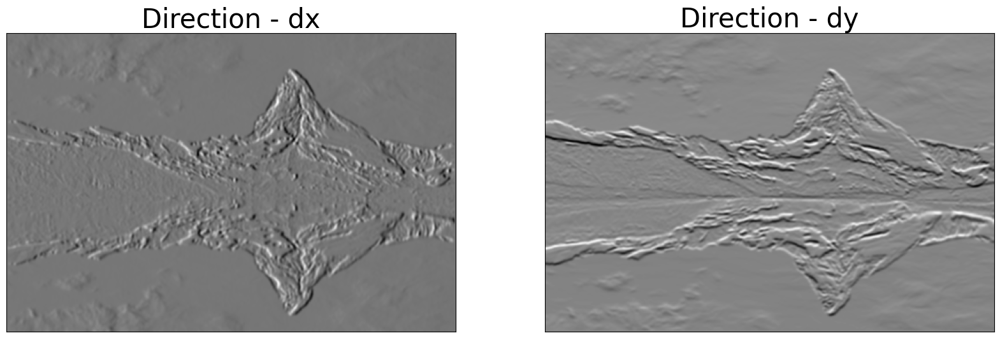

In [23]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Sobel filtering
filter_size = 7

img_sobel_dx = apply_sobel_filter(img, "x", filter_size)
img_sobel_dy = apply_sobel_filter(img, "y", filter_size)

fig, ax = plt.subplots(1, 2, figsize=(20, 10))
display_image(img_sobel_dx, axes=ax[0], cmap='gray')
ax[0].set_title("Direction - dx", fontsize=30)
display_image(img_sobel_dy, axes=ax[1], cmap='gray')
ax[1].set_title("Direction - dy", fontsize=30)
plt.show()



**YOUR ANSWER**

The Sobel filter highlights different features because it acts as a directional derivative operator, measuring the rate of intensity change (gradient) along a specific axis. Each filter only "sees" changes perpendicular to its orientation.

When applied in the X direction, the kernel compares pixels to the left and right of a center point. Because it calculates a horizontal difference, it only produces high values when crossing vertical edges, making the steep sides of the Matterhorn stand out while horizontal lines like the shoreline disappear.

Conversely, a Y-direction filter compares pixels above and below, capturing the top-to-bottom change in intensity; this highlights horizontal edges like the mountain’s ridges and snowlines.

Now, you will implement a second-order high-pass filter, the [Laplacian filter](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gad78703e4c8fe703d479c1860d76429e6). 

**QUESTION:** (/1)

In the next cell, implement the function `apply_laplacian_filter` which takes as input an image, and the filter size and returns the filtered image. Use the corresponding OpenCV function with the parameter `ddepth=cv.CV_64F`.  


In [24]:
def apply_laplacian_filter(img, filter_size):
    """
    Apply a laplace filter on a given image.
    :param img: Grayscale image to apply the Laplacian filter to
    :param filter_size: Size of the filter
    :return: img_filt: filtered image
    """
        
    # Laplacian filtering
    
    # YOUR CODE HERE
    
    img_filt = cv.Laplacian(img, ddepth=cv.CV_64F, ksize=filter_size)
    
    return img_filt

The next cell tests your implementation with filters of size (1x1), (5x5) and (11x11). 

**QUESTION:** (/2)

What are the differences between the filtered images? Why? 


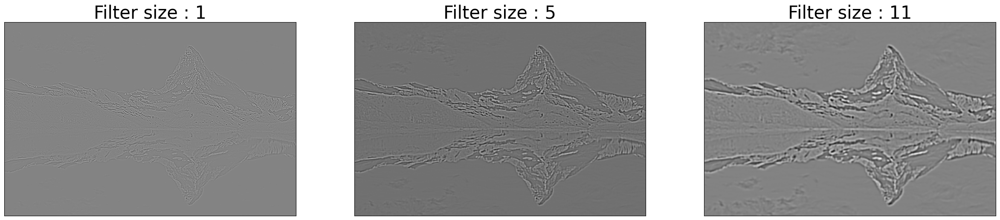

In [25]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Laplacian filtering
filter_size = [1, 5, 11]

fig, ax = plt.subplots(1, len(filter_size), figsize=(10*len(filter_size), 10))

for curr_filt_idx, curr_filt_size in enumerate(filter_size):
    img_laplacian = apply_laplacian_filter(img, curr_filt_size)
    display_image(img_laplacian, axes=ax[curr_filt_idx], cmap='gray')
    ax[curr_filt_idx].set_title("Filter size : {}".format(curr_filt_size), fontsize=30)

plt.show()



**YOUR ANSWER**

Unlike the Sobel filter, which highlights directional edges, the Laplacian is a second-order derivative that detects regions of rapid intensity change in **all** directions.

Smaller kernels (1x1 for example) are highly sensitive to high-frequency details and noise, resulting in a sharp but grainy image that highlights only the finest textures.

Larger kernels (11×11 for example) acts as an "integrator" over a larger area, effectively ignoring fine noise to focus on broader structural boundaries. This larger scale creates thicker edges because the second-order derivative's "zero-crossing" is stretched across a wider neighborhood, trading off fine-grained detail for a clearer representation of the image's overall silhouette.

Mid-range kernels (5×5, for example) act as a balance between the two, preserving both intricate textures and the overall silhouette

It is convenient to have one function for applying a high-pass filter, similarly to the function `apply_lowpass_filter()`. 

**QUESTION:** (/2)

In the next cell, implement the function `apply_highpass_filter()`, which takes as input an image and a dictionary of the filter parameters, and returns the filtered image. Use the functions you implemented in the previous cells. 

In [26]:
def apply_highpass_filter(img, filter_params):
    
    """
    Apply a highpass filter on a given image.
    :param img: Grayscale image to apply the high-pass filter to
    :param filter_params: Parameters of the filter
    :return: img_filt: filtered image
    """
    
    # YOUR CODE HERE
    
    
    # Extraction of parameters
    f_type = filter_params.get('ftype')
    f_size = filter_params.get('fsize')
    
    if f_type == 'sobel':
        # recover direction parameter for sobel filter (default value is 'x')
        f_dir = filter_params.get('direction', 'x')
        img_filt = apply_sobel_filter(img, f_dir, f_size)
        
    elif f_type == 'laplacian':
        img_filt = apply_laplacian_filter(img, f_size)
        
    else:
        raise ValueError(f"High-pass filter type '{f_type}' is not supported.")
    
    return img_filt



The next cell tests your implementation with an example of each high-pass filter. 

**QUESTION** (/3)

Comment the differences between the images. 


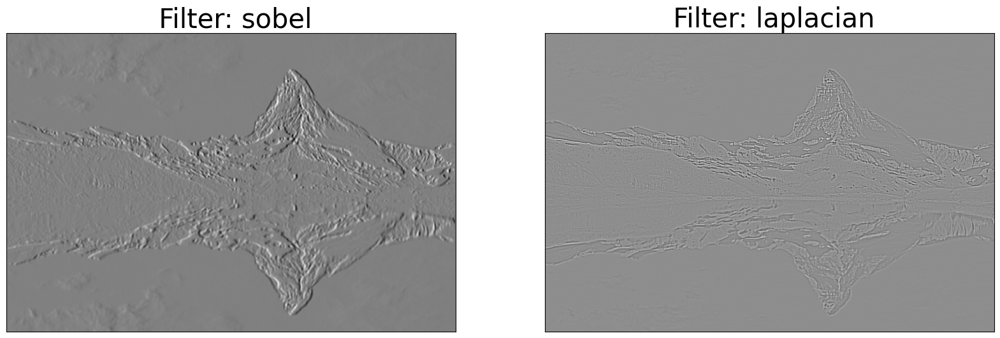

In [27]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)


filter_size = 3

# Sobel filtering
sobel_params = {"ftype":"sobel", "direction": "x", "fsize": filter_size}

# Laplacian filtering 
laplacian_params = {"ftype":"laplacian", "fsize": filter_size}

highpass_params = [sobel_params, laplacian_params]

fig, ax = plt.subplots(1, len(highpass_params), figsize=(10*len(highpass_params), 10))

for curr_highpass_idx, curr_highpass_params in enumerate(highpass_params):
    img_filt = apply_highpass_filter(img, curr_highpass_params)
    display_image(img_filt, axes=ax[curr_highpass_idx], cmap='gray')
    ax[curr_highpass_idx].set_title(" Filter: {}".format(curr_highpass_params["ftype"]), fontsize=30)

plt.show()



The Sobel filter is a first-order, directional operator that highlights specific edge orientations. This makes the image look like a 3D carving lit from the side but loses more fine details. In contrast, the Laplacian is a second-order operator that detects all edges at once, producing thinner "double-edge" outlines but exhibiting much higher sensitivity to small perturbations.

### 1.2.3 Image Thresholding

Image tresholding consist in assigning a new value to a pixel given a threhsold. If the pixel value is greater than the threshold value, it is assigned one value (*maybe white*), else it is assigned another value (*maybe black*). The function used is `cv.threshold(<image>, <thresh>, <maxVal>, <type>)`. First argument is the source image, which should be a grayscale image. Second argument is the threshold value which is used to classify the pixel values. Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value. OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:

1. `cv.THRESH_BINARY`
2. `cv.THRESH_BINARY_INV`
3. `cv.THRES_TRUNC`
4. `cv.THRESH_TOZERO`
5. `cv.THRESH_TOZERO_INV`

**QUESTION:** (/2)

In the next cell, implement the thresholding operations within the function `threshold_image()`. It takes as input a grayscale image and a dictionary of parameters for the OpenCV function `cv.threshold(<image>, <thresh>, <maxVal>, <type>)`.

In [ ]:
def threshold_image(img, thresh_params):
    """
    Apply a threshold on a given image.
    :param img: Grayscale image to threshold
    :param thresh_params: Parameters of the thresholding operation
    :return: img_thresh: thresholded image
    """    
    
    # YOUR CODE HERE
    
    # https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
    # Extract parameters from the dictionary
    thresh = thresh_params.get('thresh')
    max_val = thresh_params.get('value')
    t_type = thresh_params.get('ttype')
    
    # cv.threshold returns a tuple: (threshold_value, destination_image)
    _, img_thresh = cv.threshold(img, thresh, max_val, t_type)

    # Force 2 corner pixels to 0 and 255 to bypass Matplotlib's default color auto-scaling,
    # ensuring the display uses the full 0-255 pixel range.
    img_thresh[0, 0] = 0
    img_thresh[0, 1] = 255

    return img_thresh

The next cell tests your implementation. 

**QUESTION:** (/2)

Comment the results.

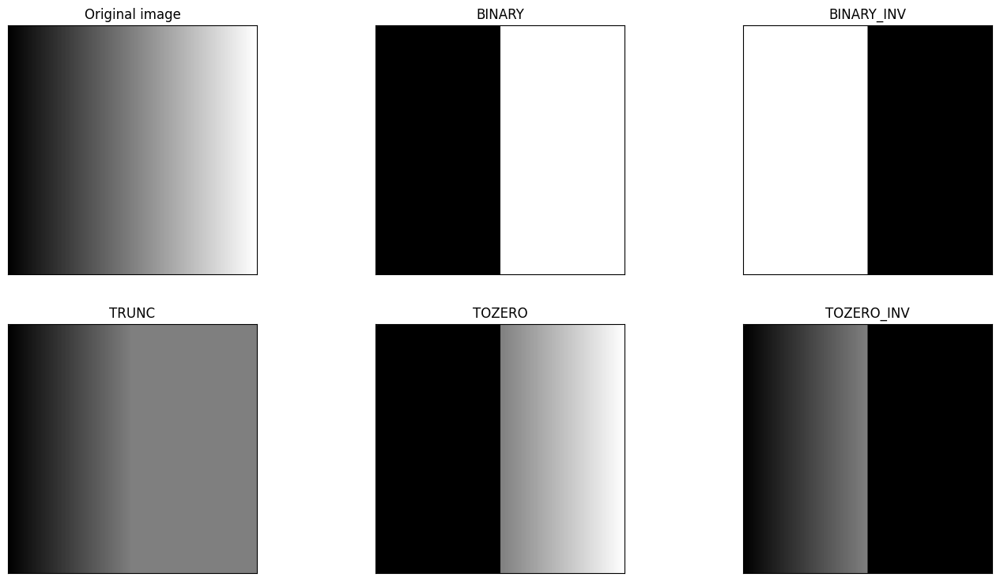

In [29]:
# Load image
img = cv.imread(os.path.join('data', 'grad.png'), cv.IMREAD_GRAYSCALE)

# Various threshold output
thresh  = 127 
tvalue  = 255

thresh_type = [cv.THRESH_BINARY, cv.THRESH_BINARY_INV, cv.THRESH_TRUNC, cv.THRESH_TOZERO, cv.THRESH_TOZERO_INV]

thresh_titles = ['BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']


fig, ax = plt.subplots(2, 3, figsize=(17, 9))
display_image(img, axes=ax[0][0], cmap='gray')
ax[0][0].set_title("Original image")

for curr_thresh_idx, curr_tthresh in enumerate(thresh_type):

    thresh_params = {"ttype": curr_tthresh, 'thresh':thresh, 'value': tvalue}
    thresh_img = threshold_image(img, thresh_params)

    # Draw each samples
    k=curr_thresh_idx+1
    r = int(k / 3)
    c = k % 3
    display_image(thresh_img, axes=ax[r][c], cmap='gray')
    ax[r][c].set_title(thresh_titles[curr_thresh_idx])



**YOUR ANSWER**

This answer relies on the true intuitive visual representation of the images, obtained by bypassing Matplotlib's default auto-scaling behavior. See the 3 last lines of the function *threshold_image* above for explanation.

Image thresholding is a method of segmenting an image by using a specific intensity value as a "cutoff" point. Depending on the type of threshold applied, here are the visual effects :

- BINARY: pixels are forced to extreme values. this creates a high-contrast silhouette with black and white.
- BINARY_INV: Creates a negative of the binary silhouette
- TRUNC: pixels brighter than the threashold are forced down to the threshold value while darker pixels are left original.
- THRESH_TOZERO: This keeps the original intensity for all pixels brighter than the threshold but turns everything darker than the threshold to pure black. It "filters out" the dark parts of the image while keeping the light parts exactly as they were
- THRESH_TOZERO_INV: Does the reverse. It keeps the dark pixels as they are but turns everything brighter than the threshold into pure black.


#### Otsu Binarization

In global thresholding, we used an arbitrary value for threshold value. How can we know a value we selected is good or not? Answer is, trial and error method. But consider an image whose histogram has two peaks (a bimodal image). For that image, we can approximately take a value in the middle of those peaks as threshold value. That is what Otsu binarization does. In simple words, it automatically calculates a threshold value from image histogram for a bimodal image. (For images which are not bimodal, binarization won’t be accurate.)

For this, our `cv.threshold()` function is used, but pass an extra flag, `cv.THRES_OTSU`. For threshold value, simply pass zero. Then the algorithm finds the optimal threshold value and returns you as the second output, retVal. If Otsu thresholding is not used, retVal is same as the threshold value you used.


Check out below example. Input image is a noisy image. In first case, a global thresholding value of 127 is applied. In second case, Otsu’s thresholding is applied directly. In third case, the image is filtered with a 5x5 gaussian kernel first to remove the noise, then applied Otsu thresholding. See how noise filtering improves the result.

**QUESTIONS:** (/5)
- For the global thresholding (case 1), why did we chose a value of 127? What would be the effect of a smaller threshold ?  Whats is the value of Otsu thresholding?
- What would be the effect of a bigger Gaussian filter, for example 9x9 pixels? 
- In this example, Otsu's thresholding gives very good results. Can you describe an example for which this method fails? 


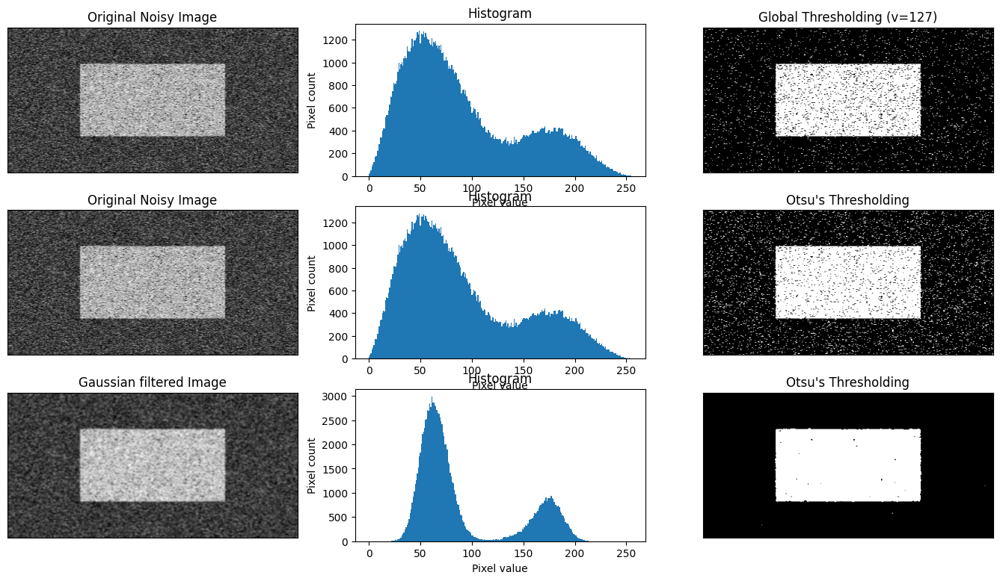

In [30]:
# Load image
img = cv.imread(os.path.join('data', 'noisy2.png'), cv.IMREAD_GRAYSCALE)

tvalue = 255

# 1. Global thresholding
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':127, 'value': tvalue}
img_tglobal = threshold_image(img, thresh_params)

# 2. Otsu thresholding
thresh_otsu_params = {"ttype": cv.THRESH_BINARY+cv.THRESH_OTSU, 'thresh':0, 'value': tvalue}
img_totsu = threshold_image(img, thresh_otsu_params)

# 3. Gaussian blurring and Otsu thresholding
thresh_params = {"ttype": cv.THRESH_BINARY+cv.THRESH_OTSU, 'thresh':0, 'value': tvalue}
blur = cv.GaussianBlur(img, (5,5), 0)
img_blur_totsu = threshold_image(blur, thresh_params)

# Compute histograms
hist_g = cv.calcHist([img], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
hist_f = cv.calcHist([blur], channels=[0], mask=None, histSize=[256], ranges=[0, 256])

# plot all the images and their histograms
images = [img, hist_g, img_tglobal,
          img, hist_g, img_totsu,
          blur, hist_f, img_blur_totsu]
titles = ['Original Noisy Image', 'Histogram', 'Global Thresholding (v=127)',
          'Original Noisy Image', 'Histogram', "Otsu's Thresholding",
          'Gaussian filtered Image', 'Histogram', "Otsu's Thresholding"]

# Display
fig, ax = plt.subplots(3, 3, figsize=(17, 9))
for k in range(9):
    r = int(k / 3)
    c = k % 3
    
    if c != 1:
        # Show image
        display_image(images[k], axes=ax[r][c], cmap='gray')
        ax[r][c].set_title(titles[k])
    else:
        # Draw histogram
        ax[r][c].bar(np.arange(images[k].shape[0]), images[k].reshape(-1), width=1)
        ax[r][c].set_title(titles[k])
        ax[r][c].set_xlabel('Pixel value')
        ax[r][c].set_ylabel('Pixel count')

**YOUR ANSWER**

### Question 1

**For the global thresholding (case 1), why did we chose a value of 127?**
The value 127 is chosen because it is the exact midpoint of the 8-bit intensity scale (0 to 255). Without analyzing the image histogram, this is the most "neutral" starting point

**What would be the effect of a smaller threshold ?**
If you lower the threshold, more pixels will be "brighter" than the threshold. This results in a much whiter image, but it also risks turning dark noise into white artifacts.

**Whats is the value of Otsu thresholding?**
Otsu's method calculates a dynamic threshold by finding the value that maximizes the inter-class variance (equivalently, minimizes the weighted within-class variance). In a perfectly bimodal image (two clear humps in the histogram), Otsu's value will be the exact "valley" between those two peaks.

### Question 2

**What would be the effect of a bigger Gaussian filter, for example 9x9 pixels?**

It removes more high-frequency noise, which makes the two peaks in the histogram (foreground and background) look smoother and more distinct. The trade of of this better group distinction is at the cost of a Loss of Detail because the image is thus more blurry.

### Question 3

**In this example, Otsu's thresholding gives very good results. Can you describe an example for which this method fails?**

Uneven Illumination: If one side of the image is very bright and the other is in deep shadow, a "dark" pixel in the bright area might be lighter than a "bright" pixel in the dark area. A single global threshold like Otsu cannot handle this and would not help us detect what we want.

### 1.2.4 Edge detection and denoising

Edge detection is an application of filtering, which consists in detecting the contours of the objects in the image. 
In this application, a low-pass filter, a high-pass filter and a binary thresholding operation are often used consecutively. 

We start with a naive approach to detect edges, a combination of the Sobel high-pass filter and a binary thresholding.  

**QUESTION:** (/2)

In the next cell, implement the function `find_edges_naive()` with the following operations:
- Use the function `apply_highpass_filter()` 
- Take the absolute value of the filtered image
- Convert it to a uint8-grayscale image
- Use the function `threshold_image()`on this grayscale image


In [31]:
def find_edges_naive(img, highpass_params, thresh_params):
    
    """
    Find edges on a given image.
    :param img: Grayscale image for edge detection
    :param highpass_params: Parameters of the high-pass filter
    :param thresh_params: Parameters of the thresholding operation
    :return: img_edges: Edges of the image
    """
    
    # YOUR CODE HERE
    
    # Apply the high-pass filter (Sobel)
    filtered_img = apply_highpass_filter(img, highpass_params)
    
    # Take the absolute value of the filtered image
    abs_img = np.abs(filtered_img)
    
    # 3. Convert to a uint8-grayscale image (0-255)
    img_uint8 = np.clip(abs_img, 0, 255).astype(np.uint8)
    
    # 4. Apply binary thresholding
    img_edges = threshold_image(img_uint8, thresh_params)
    
    return img_edges

The next cell tests your implementation with a Sobel filter of size (3x3) in the x-direction and a binary threshold.

**QUESTION:** (/2)

Comment the results.

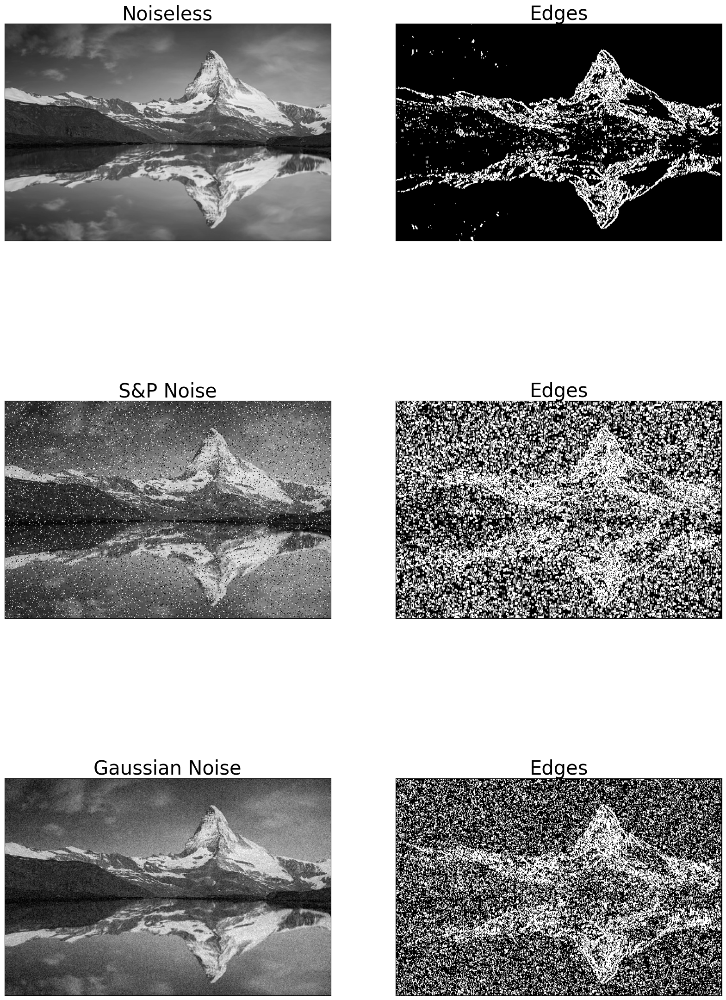

In [32]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE), 
        cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["Noiseless", "S&P Noise", "Gaussian Noise"]
        
filter_size = 3
thresh = 50 
tvalue = 255

highpass_params = {"ftype":"sobel", "direction":"x", "fsize": filter_size}
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':thresh, 'value': tvalue}

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_naive(curr_img, highpass_params, thresh_params)

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("Edges", fontsize=30)
    
plt.show()



**YOUR ANSWER**

The method successfully captures object contours by isolating rapid intensity shifts for the well defined image. However, for noisy images, since the high-pass filter does not distinguish between actual edges and random pixel noise, both are amplified. The thresholding then incorrectly classifies these noise spikes as edges, producing a 'noisy' binary image.

Now, let's improve this edge detector by adding a low-pass filter before using the function `find_edges_naive()`. 



**QUESTION:** (/1)

In the next cell, code the function `find_edges_better()` with the following operations:
- Use the function `apply_lowpass_filter()` 
- Use the function `find_edges_naive()` on the low-pass filtered image.


In [33]:
def find_edges_better(img, lowpass_params, highpass_params, thresh_params):
    
    """
    Find edges on a given image.
    :param img: Grayscale image for edge detection
    :param lowpass_params: Parameters of the low-pass filter
    :param highpass_params: Parameters of the high-pass filter
    :param thresh_params: Parameters of the thresholding operation
    :return: img_edges: Edges of the image
    """
    
    # YOUR CODE HERE
    
    # low-pass filter to denoise the image
    denoised_img = apply_lowpass_filter(img, lowpass_params)
    
    # naive function on the new "clean" image
    img_edges = find_edges_naive(denoised_img, highpass_params, thresh_params)
    
    return img_edges


The next cell tests your implementation with : 
- a Gaussian filter of size (3x3)
- a Sobel filter of size (3x3) in the x-direction 
- a binary threshold.

**QUESTION:** (/3)

Comment the results.

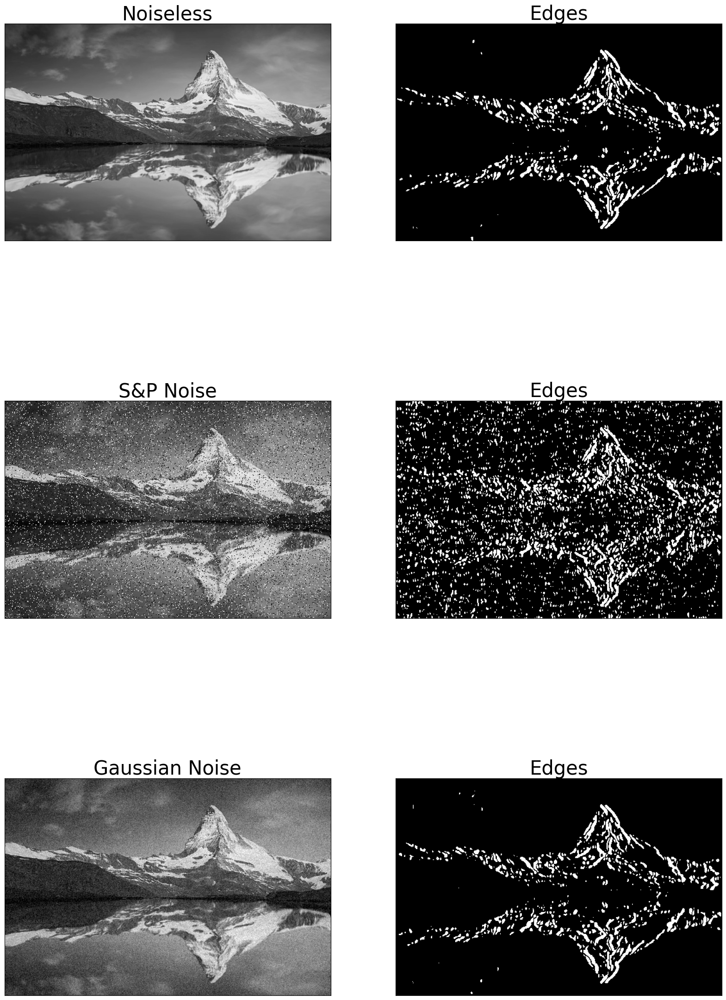

In [34]:
# Load image
imgs = [cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE), 
        cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["Noiseless", "S&P Noise", "Gaussian Noise"]
        
lowpass_filter_size = 7
highpass_filter_size = 3
thresh = 50 
tvalue = 255

lowpass_params = {"ftype":"gaussian", "fsize": lowpass_filter_size}
highpass_params = {"ftype":"sobel", "direction":"x", "fsize": highpass_filter_size}
thresh_params = {"ttype": cv.THRESH_BINARY, 'thresh':thresh, 'value': tvalue}

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_better(curr_img, lowpass_params, highpass_params, thresh_params)

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("Edges", fontsize=30)
    
plt.show()



**YOUR ANSWER**

Note to mention that this answer is based on the code provided (so with a Gaussian filter of size 7x7 and not 3x3)

Adding the Gaussian filter effectively addresses the Gaussian noise issue observed in the naive approach. By smoothing out high-frequency pixel variations before they are put into the Sobel filter, the resulting binary image is much cleaner and more focused on true (vertical) edges. 

However, for the Salt and Pepper Noise, the artifacts are significantly reduced but we still do not have acceptable definition of edges since the noise artifact as in Salt and peper are too big to be effectivelly reduced with the Gaussian filter. And a bigger filter would cause too much blurring which would also compromize the edge definition on the image.

Now that you developed some intuition, it is your turn to design the best edge detector for both noisy images. 

**QUESTION:** (/4)

In the next cell, find the combination of low-pass filter, high-pass filter and thresholding operation that gives you the best edges for each noisy image. Justify your choice and comment your results. 


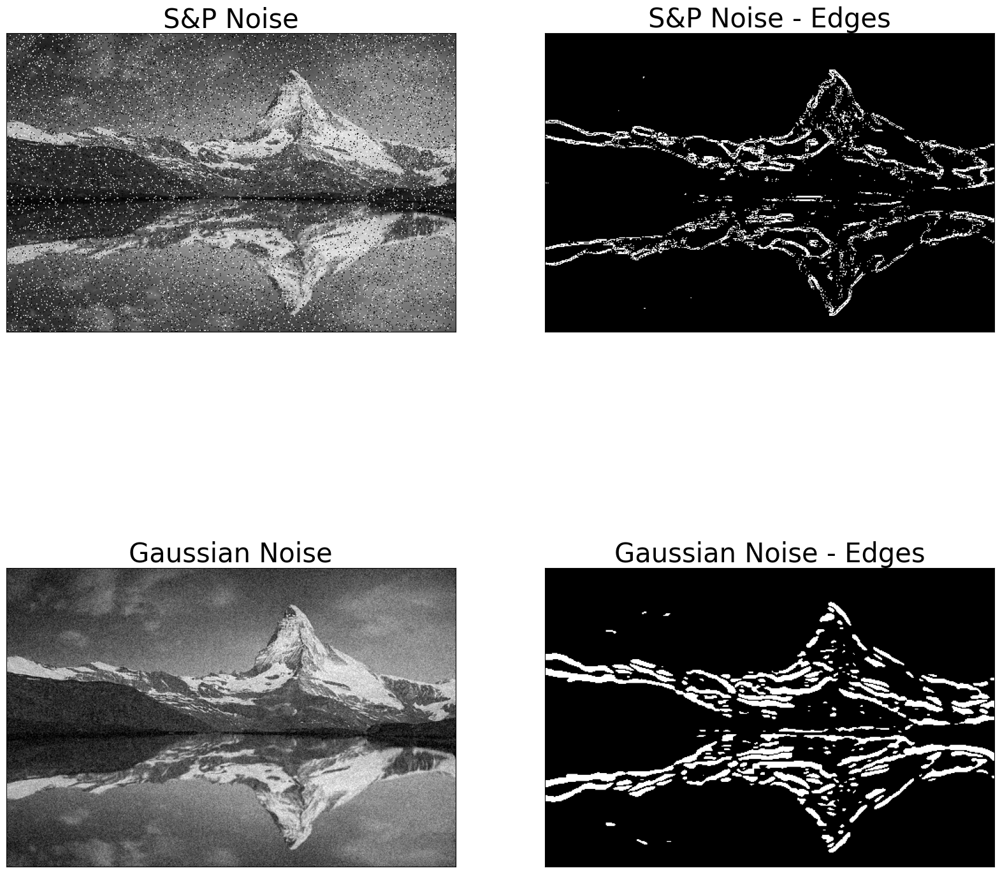

In [35]:
# Load images
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["S&P Noise", "Gaussian Noise"]

# Best detector parameters 

###################
# YOUR CODE HERE
#Gaussian image
lowpass_params_g = {"ftype":"gaussian", "fsize": 11}
highpass_params_g = {"ftype":"sobel", "direction":"y", "fsize": 3}
thresh_params_g = {"ttype": cv.THRESH_BINARY, 'thresh':50, 'value': 255}

#S&P image
lowpass_params_sp = {"ftype":"median", "fsize": 7}
highpass_params_sp = {"ftype":"laplacian", "fsize": 3}
thresh_params_sp = {"ttype": cv.THRESH_BINARY, 'thresh':50, 'value': 255}
###################

# Edge detection
lowpass_params = [lowpass_params_sp, lowpass_params_g]
highpass_params = [highpass_params_sp, highpass_params_g]
thresh_params = [thresh_params_sp, thresh_params_g]

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges = find_edges_better(curr_img, lowpass_params[curr_img_idx], highpass_params[curr_img_idx], thresh_params[curr_img_idx])

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("{} - Edges".format(imgs_name[curr_img_idx]), fontsize=30)
    
plt.show()

**YOUR ANSWER**

For both noises, we use a binary threshold. We realised that value between 30 and 80 are working very well on this image with the rest of the parameters explained bellow. We used 50 for both images because this seems to be a good sweet spot that works consistently in this case.

**For Salt and Pepper Noise**
The choice of low-pass filter is Median because (as seen in 1.2.1) this filter is the best for eliminating rare but big artifacts. Since here we want edge detection and we care less about image details and more about general information, we can extend the filter size to 7x7.

Concerning the high-pass filter, since we got an image that shows the general information well with the low-pass filter, a Laplacian filter seems to work well to capture edges in all directions. The size is 3x3 to only select the sharpest transitions.

**For Gaussian Noise**
The choice of low-pass filter is Gaussian because (as seen in 1.2.1) this filter is the best for eliminating very dense and thin noise. Since we are mostly interested in the global image information rather than the small details, we use a "big" filter of size 11x11 to eliminate as much noise as possible.

Since with this method the edges get a little bit smoother, using a Sobel high-pass filter works better. This filter works best in the y-direction for this image since it is a landscape. The filter size is 3x3 so we only keep the most important information

As you can imagine, the OpenCV library has some edge detection algorithm directly available. One of them is the [Canny edge detector](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga2a671611e104c093843d7b7fc46d24af). More info [here] (https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html). 

**QUESTION:** (/2)

In the next cell, implement the function `find_edges_canny()` which takes as input an image and the detector parameters (thresholds for filtering (See [doc](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga2a671611e104c093843d7b7fc46d24af)), and the filter size) and returns the filtered image. Use the corresponding OpenCV function. 


In [36]:
def find_edges_canny(img, canny_params):
    """
    Apply a canny filter on a given image.
    :param img: Grayscale image to detect edges in
    :param canny_params: Dict with keys "thresholds" (min, max) and "fsize" (Sobel aperture size)
    :return: img_filt: Binary edge image
    """

    # YOUR CODE HERE
    
    # Extract the tuple (min_val, max_val) from the "thresholds" key
    th_range = canny_params.get('thresholds')
    th1 = th_range[0]
    th2 = th_range[1]
    
    # Extract the aperture size (Sobel kernel size) from "fsize"
    a_size = canny_params.get('fsize', 3) 
    
    # Apply the Canny algorithm
    img_filt = cv.Canny(img, th1, th2, apertureSize=a_size)
    
    return img_filt

The next cell tests your implementation with a filter of size (3x3) and four threshold ranges. 

**QUESTION:** (/2)

What is the effect of each threshold (low/high minimal threshold, low/high maximal threshold) on the filtered image?


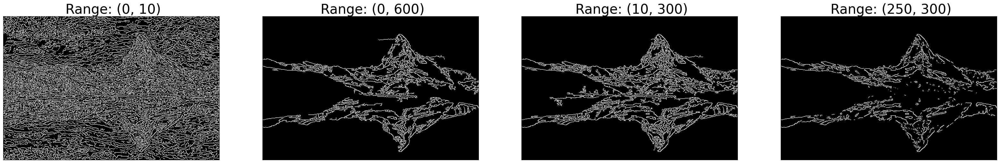

In [37]:
# Load image
img = cv.imread(os.path.join('data', 'matterhorn.jpg'), cv.IMREAD_GRAYSCALE)

# Canny filtering
filter_size = 3

thresholds = [(0, 10), (0, 600), (10, 300), (250, 300)]

fig, ax = plt.subplots(1, len(thresholds), figsize=(10*len(thresholds), 10))

for curr_thresh_idx, curr_thresh in enumerate(thresholds):
    
    canny_params = {"fsize":filter_size, "thresholds":curr_thresh}
    img_canny = find_edges_canny(img, canny_params)
    display_image(img_canny, axes=ax[curr_thresh_idx], cmap='gray')
    ax[curr_thresh_idx].set_title(" Range: {}".format(curr_thresh), fontsize=30)

plt.show()



**YOUR ANSWER**

**Maximal Threashold**

This is the "Seed" threshold. It determines the initial strength required for a pixel to be considered a strong edge.

- High Value (300 or 600): Only the most intense changes in the image (sharpest contrasts) are accepted as starting points. This produces a very clean result but leads to less subtle or softer edges.

- Low Value (10): Almost every slight change in color/intensity is considered a "strong" edge. This leads to a lot of false positives and noise.

**Minimal Threshold**

This is the "Connectivity" threshold. It allows the algorithm to "follow" an edge.

- Low Value (0 or 10): The algorithm is very "lenient." It will follow an edge for a long time even as it gets very faint. This leads to filling more the gaps, but can also produce long continuous lines that can lead to strings of noise as seen on the top mountains.

- High Value (250): The algorithm is very "strict." It only allows pixels that are nearly as strong as the "seed" pixels. This results in softer delimitations but also sometimes more fragmented lines.

In the previous cell, you found the edges of the noiseless image. 


**QUESTION:** (/4)

In the next cell, find the thresholds that give the best edges for the images `matterhorn_noise1.jpg` and `matterhorn_noise2.jpg`. Justify your choice, and compare your results with the homemade edge detector you implemented previously. 


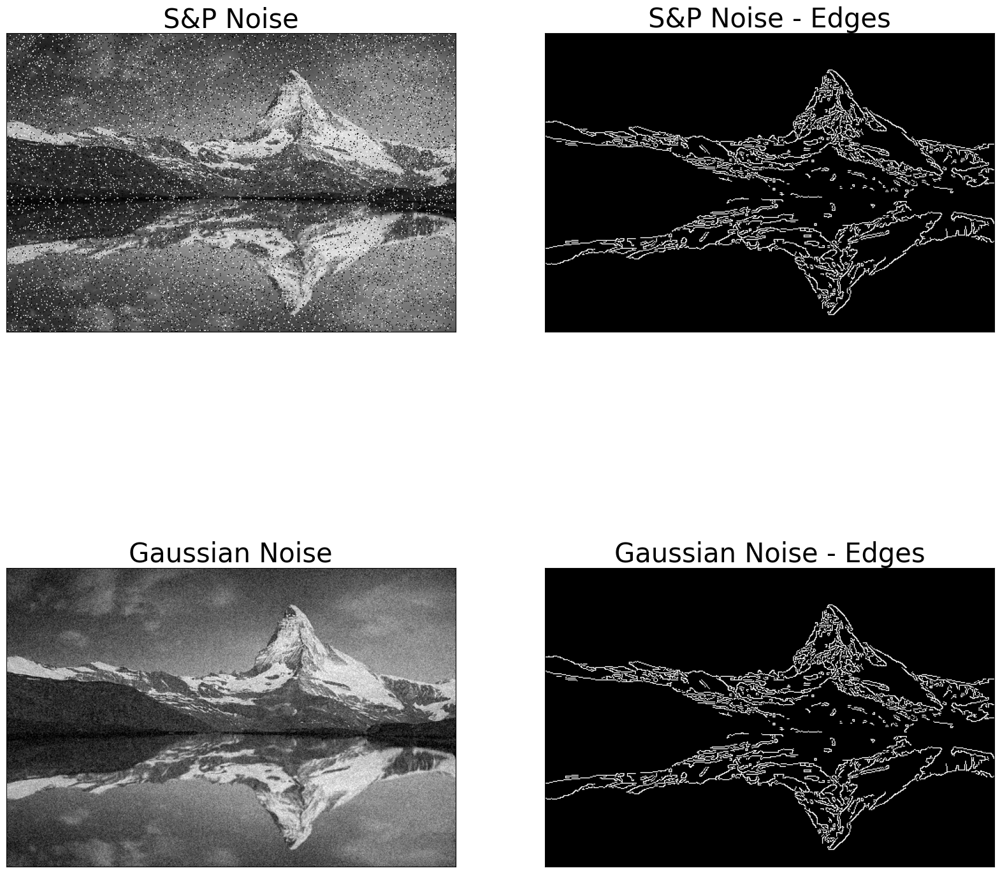

In [38]:
# Load images
imgs = [cv.imread(os.path.join('data', 'matterhorn_noise1.jpg'), cv.IMREAD_GRAYSCALE),
        cv.imread(os.path.join('data', 'matterhorn_noise2.jpg'), cv.IMREAD_GRAYSCALE)]

imgs_name = ["S&P Noise", "Gaussian Noise"]

# Best detector parameters 


###################
# YOUR CODE HERE
canny_params_sp = {"fsize": 3, "thresholds": (150, 300)}
canny_params_g = {"fsize": 3, "thresholds": (150, 300)}    
###################

# Edge detection
canny_params = [canny_params_sp, canny_params_g]

fig, ax = plt.subplots(len(imgs), 2, figsize=(20, 10*len(imgs)))

for curr_img_idx, curr_img in enumerate(imgs):
    img_edges_canny = find_edges_canny(curr_img, canny_params[curr_img_idx])

    display_image(curr_img, axes=ax[curr_img_idx, 0], cmap='gray')
    ax[curr_img_idx, 0].set_title(imgs_name[curr_img_idx], fontsize=30)
    display_image(img_edges_canny, axes=ax[curr_img_idx, 1], cmap='gray')
    ax[curr_img_idx, 1].set_title("{} - Edges".format(imgs_name[curr_img_idx]), fontsize=30)
    
plt.show()


**YOUR ANSWER**

**Justification of Choices**

For both noisy images, the best results were obtained using a threshold range of (150, 300). There does not appear to be a significant difference in performance between the two noise types when using Canny edge detector. The reason for choosing 150 - 300 range for the threasholds is that it prevent to selecting all the details possible as edges while maintaining continuous edges for the principal components. Smaller minimal threashold would lead to having too much details as edges while larger minimal threashold would lead to discontinuous edges. For the Maximum threashold we want sufficiently big value so the noise is not detected as an edge but not too large so it doesnt miss any important edge.

**Comparison with Homemade Detector**

The Canny detector provides clearly better results than our homemade version. For the Gaussian noisy image, the previous detector produced thick, blurry edges, whereas Canny provides much thinner and more precise lines. Additionally, thanks to hysteresis and double thresholding, Canny maintains continuous contours where the previous method left gaps. Overall, it achieves superior noise removal, resulting in a much cleaner final image with continuous edges.

## 1.3 Introduction to Histogram of Gradient (*HoG*)

(30 points)

### 1.3.1 Introduction

Histogram of Oriented Gradients (*HOGs*) are descriptors mainly used in computer vision and machine learning for object detection. HOG features were first introduced by Dalal and Triggs in their CVPR 2005 paper: "Histogram of Oriented Gradients for Human Detection" (<http://ieeexplore.ieee.org/document/1467360/>); which transforms image pixels into a vector representation that is sensitive to broadly informative image features regardless of confounding factors like illumination. Later on, we will use these descriptors for detection and tracking. 


In their work, Dalal and Triggs proposed HOG and a 5-stages descriptor to classify humans in static images.
The 5 stages included:

    1. Pre-processing and scaling.
    2. Computing gradients in both the x and y directions.
    3. Obtaining weighted votes in spatial cells (local histograms).
    4. Contrast normalizing overlapping spatial cells (Blocks).
    5. Collecting all Histograms of Oriented gradients to form the final feature vector.


In most real-world applications, HOG is used in conjunction with a [__Linear SVM__](https://en.wikipedia.org/wiki/Support_vector_machine) to perform object detection. HOG rapidly became one of the most used descriptors in image classification. The reason HOG is employed so heavily is because the local object appearance and shape can be characterized using the distribution of local intensity gradients. 

We’ll be discussing the steps necessary to combine both HOG and a Linear SVM into an object classifier later in this course. But for now, just understand that HOG is mainly used as a descriptor for object detection and that later these descriptors can be fed into a machine learning classifier.


### 1.3.2 Objectives of this module

HOG based classifiers are already implemented in several methods inside OpenCV. In this module, we will follow the basic steps to construct a feature vector based on HOG from scratch. Once the basic concepts are clear, at the end of this notebook, we will include the OpenCV build-in function used in real-world applications. The parameters of this function should be then clear for you to tune and play with for later applications.

*What are HOG descriptors used to describe?*

HOG descriptors are mainly used to describe the structural shape and appearance of an object in an image, making them excellent descriptors for object classification. In addition, since HOG captures local intensity gradients and edge directions, it also makes them good as texture descriptors.


### 1.3.3 Preprocessing

Typically, a feature descriptor converts an image of size $ width \times height \times 3 $(channels) to a feature vector array of length $n$. In the case of our implementation of the HOG feature descriptor, the input will be a grayscale image of size 64 x 128 and the output feature vector of a length that will depend on various choices that we will make along the notebook. 

Before any computation, we must ensure the input image has the right shape. 

**QUESTION:** (/2)

In the next cell, convert the image `lena.png` into the desired format, i.e. a grayscale image of size (64x128).

Input image has dimensions: (512, 512, 3)
Final image has dimensions: (128, 64)


Text(0.5, 1.0, 'Image for HoG')

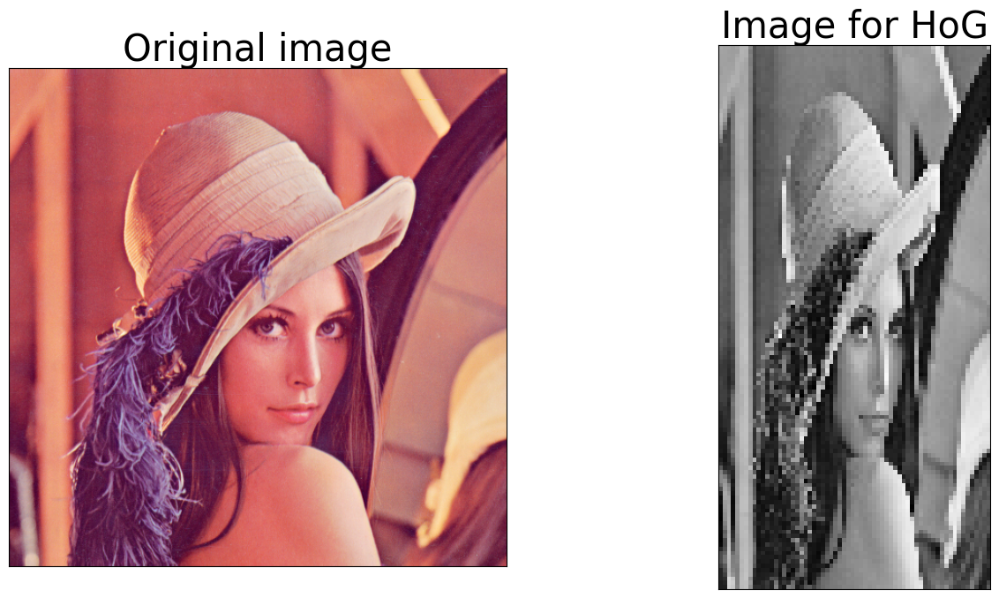

In [39]:
# loads base image
img = cv.imread(os.path.join('data', 'lena.png'))
print('Input image has dimensions: {}'.format(img.shape))

# converts to grayscale and resize

###################
# YOUR CODE HERE 
full_img_gray =  cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gray = cv.resize(full_img_gray,(64,128))
###################

print('Final image has dimensions: {}'.format(img_gray.shape))

fig, ax = plt.subplots(1, 2, figsize=(16, 8))
display_image(img, axes=ax[0])
ax[0].set_title("Original image", fontsize=30)
display_image(img_gray, axes=ax[1], cmap='gray')
ax[1].set_title("Image for HoG", fontsize=30)



### 1.3.4 Gradient computation

https://en.wikipedia.org/wiki/Image_gradient

Gradient vectors (or “image gradients”) are one of the most fundamental concepts in computer vision; many vision algorithms involve computing gradient vectors for each pixel in an image. A gradient vector it’s simply a measure of the change in pixel values along the x-direction and the y-direction around each pixel. The magnitude is defined as:

$$
G(x,y) = \sqrt{(\Delta x^2 + \Delta y^2)}
$$

and the phase: 

$$
\theta(x,y) = atan(\frac{\Delta x}{\Delta y})
$$

Where: $\Delta x = f(x+1,y) - f(x-1,y)$ and $\Delta y = f(x,y+1) - f(x,y-1)$, are simply the directional change from one pixel to the other.

The simplest implementation of the aforementioned operators computes each value by using a mask operator: $-1|0|1$ over the pixel position in each direction. However the Sobel operator you implemented in Section 1.2.2is usually employed as it is more robust to intensity changes.

**QUESTION** (/2)

In the next cell, use the function `apply_sobel_filter` on the image `img_gray` to compute the gradient of the image in the `x` and `y` directions.



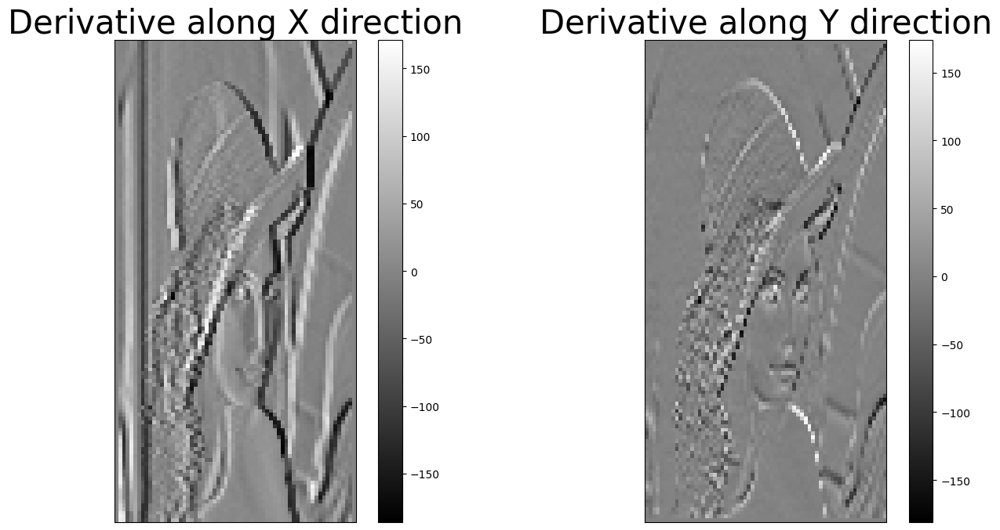

In [40]:
filter_size = 1

# Sobel filtering


###################
# YOUR CODE HERE
gx = apply_sobel_filter(img_gray, 'x', filter_size)
gy = apply_sobel_filter(img_gray, 'y', filter_size)
###################

fig, ax = plt.subplots(1, 2, figsize=(16, 8))
obj = display_image(gx, axes=ax[0])
ax[0].set_title('Derivative along X direction', fontsize=30)
fig.colorbar(obj, orientation ='vertical', ax=ax[0])
obj = display_image(gy, axes=ax[1])
ax[1].set_title('Derivative along Y direction', fontsize=30)
fig.colorbar(obj, orientation ='vertical', ax=ax[1])
plt.show()

**QUESTION**: (/2)
- Do the images above make sense?  Explain what each image displayed. 
- What do the brightest or darkest pixels mean for each direction?


**YOUR ANSWER :**
* The first image displays the derivative along the X-axis, so how much brightness change from left to right. It makes sense since the image looks like it is enlightened from the left as it shows vertical edges, like the sides of the face for example. The second image displays the derivative along the Y-axis. It makes sense since the image emphasized on horizontal edges, like for example the hat or the eyelashes.

| Appearance | Value | Interpretation |
| :--- | :--- | :--- |
| **Brightest** | Positive ($+$) | Sharp transition from **Dark to Light** |
| **Neutral Gray** | Zero ($0$) | **No change** (solid color/flat area) |
| **Darkest** | Negative ($-$) | Sharp transition from **Light to Dark** |

In X-Direction :
* Bright: Vertical edge going from dark (left) to light (right).
* Dark: Vertical edge going from light (left) to dark (right).

In Y-Direction :
* Bright: Horizontal edge going from dark (top) to light (bottom).
* Dark: Horizontal edge going from light (top) to dark (bottom).

As mentionned in the introduction, the images above shows the gradient in a given direction. We can use them to compute the magnitude and phase as in the above formulas.

**QUESTION**: (/1)

In the next cell, compute the magnitude and the phase (in degrees) of each pixel from the gradient maps `gx` and `gy` computed above. 

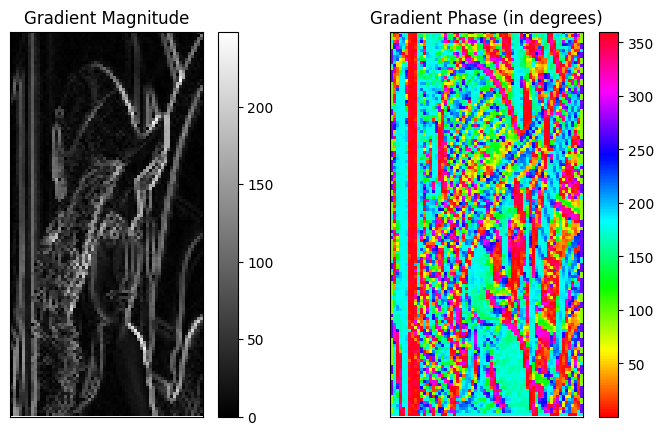

In [41]:
###################
# YOUR CODE HERE

magnitude = np.sqrt(gx**2 + gy**2)
phase_rad = np.arctan2(gy, gx)  # arctan2(y, x) returns values in [-π, π]
phase = np.degrees(phase_rad) + 180  # Shift range to [0°, 360°] for histogram binning
###################

# Plots of the magnitude and the phase:
fig, ax = plt.subplots(1, 2, figsize=(9, 5))

#The magnitude is shown in gray scale.
obj = display_image(magnitude, axes=ax[0])
ax[0].set_title('Gradient Magnitude')
fig.colorbar(obj, orientation ='vertical', ax=ax[0])

# The phase is shown using a color map. 
obj = display_image(phase, axes=ax[1], cmap='hsv')
ax[1].set_title('Gradient Phase (in degrees)')
fig.colorbar(obj, orientation ='vertical', ax=ax[1])
plt.show()

From the image above, we see that the phase is computed from 0 to 360 degrees. While this is conceptually correct, two pixels with very similar angular values towards the X-axis (let's say 0.1 radians and 6.2 radians) will be considered very different by a naive classifier. We correct this behavior by wrapping the phase from 0 to $\pi$ (0 to 180 degrees). At the end of the notebook, you will correct the phase range.


**QUESTION:** (/1)

From the phase image, we see many red pixels (values very close to zero). Interpret this observation.

**Hint:** consider the values of gx and gy in those regions.

**YOUR ANSWER :**
The red pixels in the Phase image represent an angle of 0 degrees. 

**Mathematical Interpretation:**
* This happens when **gx > 0** and gy ≈ 0: the function `arctan2(gy, gx)` returns 0 when the numerator (gy) is zero and the denominator (gx) is positive. Note: `arctan2` is used rather than plain `arctan(gy/gx)` because it correctly handles the full 360° range including the gx = 0 case.

**Pixels variation Interpretation:**
* A "0-degree" phase means there is only horizontal change : this indicates **vertical edges** (like the sides of the face or the vertical bars in the background).

### 1.3.5 Computation of the Histograms of the Phase for Local Cells

In the next step, you will compute the histograms of Oriented Gradients, which are histograms of the phase distribution in a region of the image. We split the image into cells, rectangular regions of interest sliding across the image domain. The size and shape of the cell will affect the performance of HOG as a feature vector. For each cell, you will compute a histogram. In this work, you will use $8 px\times 8px$ cells. 

In the next cell, we show you the cell subdivisions of the (color) image for cells of size $8\times 8$ and the histogram of the first cell of the image (starting at the pixel (0, 0)) with 36 bins. The number of bins considered will affect the performance and quality of the descriptor. In the original paper, Dalal and Triggs found that nine bins (from 0 to 180 degrees) performed well for human detection. 

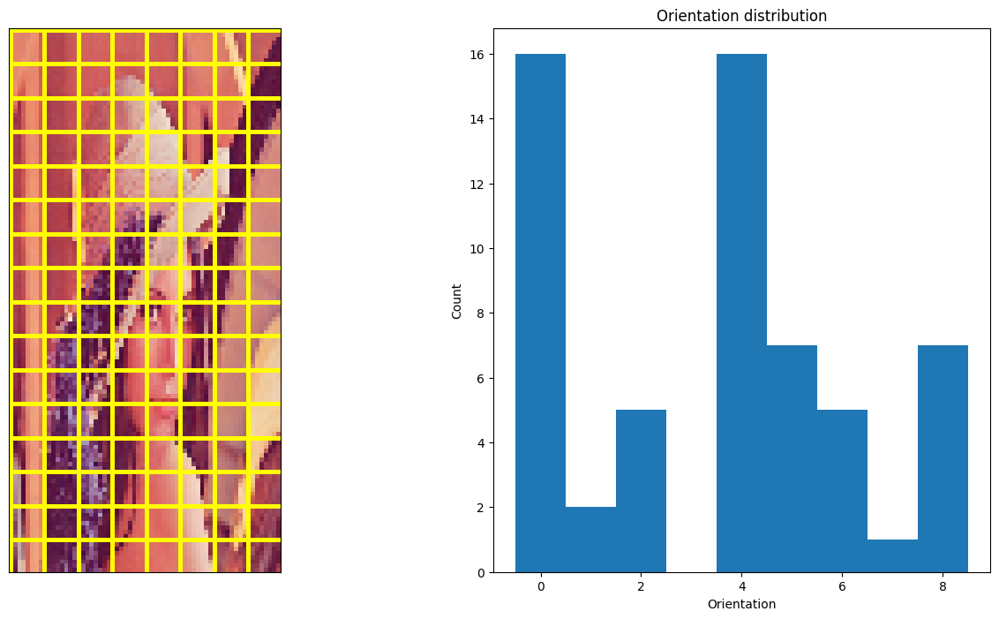

In [42]:
# This parameter is usually constant and it's never changed true the procedure.
CELL_SIZE = 8

# Histogram of the Phase for the very first cell
num_of_bins = 9

# Compute histogram
hist = cv.calcHist([phase[:CELL_SIZE, :CELL_SIZE].astype(np.float32)], channels=[0], mask=None, histSize=[num_of_bins], ranges=[0,360])

# Example of a cell drawn in yellow
img_canvas = cv.resize(img, (64, 128)) # temporal image.

for stride_x in range(1,img.shape[0]-1):
    for stride_y in range(1,img.shape[1]-1):
        cv.rectangle(img_canvas, (0 + (stride_x-1)*CELL_SIZE, 0 + (stride_y-1)*CELL_SIZE), (0 + stride_x*CELL_SIZE, 0 + stride_y*CELL_SIZE), (0, 255, 255))

# Plot
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

display_image(img_canvas, axes=ax[0])

ax[1].bar(np.arange(hist.shape[0]), hist.reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

plt.show()

The previous cell shows you how to compute the histogram of one cell, but we need the histogram of each cell.

**QUESTION:** (/5)

In the next cell, implement the function `computeCellHistograms()` that takes as input the phase of the image, the number of bins, and the cell size, and returns a [list](https://docs.python.org/3/tutorial/datastructures.html) containing the histograms. 

In [43]:
def computeCellHistograms(phase, cell_size, num_of_bins):
    """
    Compute histogram for each cells and concatenate them.
    
    :param phase: 1 channel image with the gradient direction.
    :params cell_size: cell size (8px) 
    :params num_of_bins: number of bins in the histogram
    :return concatenated_histograms: list of histograms
    """
    
    # Resulting histogram list
    concatenated_histograms =[];

    height, width = phase.shape
    # Compute the histogram for each cell
    for i in range(0, height, cell_size):
        for j in range(0, width, cell_size):
            cell_phase = [phase[i:i+cell_size, j:j+cell_size].astype(np.float32)]
            hist = cv.calcHist(cell_phase, channels=[0], mask=None, histSize=[num_of_bins], ranges=[0,360])
            concatenated_histograms.append(hist)
    return concatenated_histograms


The next cell tests your implementation.

**QUESTION**: (/1)

What should be the number of histograms? Is it correct?


In [44]:
# Compute histogram
histograms = computeCellHistograms(phase, CELL_SIZE, num_of_bins)
print("Number of histograms: {}".format(len(histograms)))

Number of histograms: 128


**YOUR ANSWER**
The number of histograms is equal to the number of cells in the image.

We have :
* Image Size: $64$ (width) $\times$ $128$ (height)
* Cell Size: $8 \times 8$

So we can deduce that :
* Number of cells along height: $\frac{128}{8} = 16$
* Number of cells along width: $\frac{64}{8} = 8$
* Total Histograms: $16 \times 8 = 128$

There should be exactly **128 histograms**, so the result given by the function is correct.

The function `computeCellHistograms()` computes the histogram of each cell. However, it assumes that each direction has the same importance and contributes equally to the histogram. In the original paper, they proposed to weight the histogram, for instance, using the gradient magnitude. The histogram bins of each cell are weighted by the gradient magnitude. The effect is depicted below:

<img src="https://gurus.pyimagesearch.com/wp-content/uploads/2015/03/hog_histogram_animation.gif">
<em> Image taken from: https://gurus.pyimagesearch.com </em>

The effect of normalizing the weights will directly affect the contribution of each direction.

**QUESTION:** (/5)

In the next cell, implement the function `computeCellWeightedHistogram()` to return weighted histograms. The new version takes as input the phase of the image, the cell size, the number of bins, and the gradient magnitude and returns a [list](https://docs.python.org/3/tutorial/datastructures.html) containing the histograms. 

**HINT:** Avoid pre-defined functions to compute the histogram and code your own function.



In [45]:
def computeCellWeightedHistogram(phase, magnitude, cell_size, num_of_bins):
    
    """
    Compute weighted histogram for each cells and concatenate them.
    
    :param phase: 1 channel image with the gradient direction.
    :param magnitude: 1 channel image with the gradient magnitude.
    :params cell_size: cell size (8px) 
    :params num_of_bins: number of bins in the histogram 
    :return weigthed_and_concatenated_histograms: list of weighted histograms
    """

    weigthed_and_concatenated_histograms = []
    
    
    # CODE HERE
    height, width = phase.shape
    # Compute the histogram for each cell
    for i in range(0, height, cell_size):
        for j in range(0, width, cell_size):
            cell_phase = phase[i:i+cell_size, j:j+cell_size]
            cell_mag = magnitude[i:i+cell_size, j:j+cell_size]
            
            hist, _ = np.histogram(cell_phase, bins=num_of_bins, range=(0, 360), weights=cell_mag)
            weigthed_and_concatenated_histograms.append(hist)
            
    return weigthed_and_concatenated_histograms

The next cell shows you the histogram and the weighted histogram of the first cell. 

**QUESTION:** (/3)

Compare and comment the histograms.

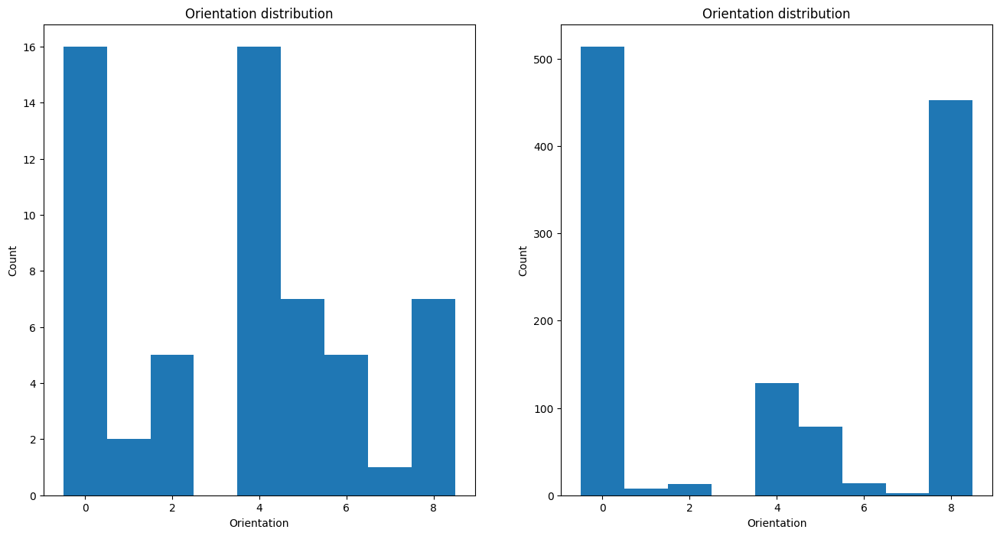

In [46]:
# Compute weighted histogram
weightedHistograms = computeCellWeightedHistogram(phase, magnitude, CELL_SIZE, num_of_bins)


# Plot
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].bar(np.arange(histograms[0].shape[0]), histograms[0].reshape(-1), width=1)
ax[0].set_xlabel('Orientation')
ax[0].set_ylabel('Count')
ax[0].set_title('Orientation distribution')


ax[1].bar(np.arange(weightedHistograms[0].shape[0]), weightedHistograms[0].reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

plt.show()

**YOUR ANSWER**
Comparison
* Left (Unweighted): This just counts pixels. Every pixel gets same weight (=1). The vertical scale is small (up to 15) because it only counts the 64 pixels in the cell.
* Right (Weighted): This sums the strength (magnitude) of each pixel. If an edge is sharp, it gets a much bigger vote. The vertical scale is much higher (up to 500) because magnitudes are large numbers.

In the right graph, bins 1, 2, and 5 almost disappear. This is because "noise" has very low strength in the weighting since it turns down the background noise. Bins 0 and 8 become much taller and emphasize on the edges. By ignoring blurry textures and focusing on sharp edges, the computer can find objects (like people) more accurately.

### 1.3.6 Block normalization

In the previous steps, we created the oriented histogram based on the gradient magnitude. However, gradients are sensitive to overall lighting. If you make the image darker by dividing all pixel values by 2, for example, the gradient magnitude will change by half, and, therefore, the histogram values will change by half. Ideally, we want our descriptor to be independent of lighting variations. In other words, we would like to “normalize” the histograms to stabilitze the results. 

Rather than normalizing each histogram individually, we group the cells into __blocks__ and normalize the histogram of the block instead of the indivual cell. These procedure makes the feature detector less sensitive to intensity changes.


<img src = "https://gurus.pyimagesearch.com/wp-content/uploads/2015/03/hog_contrast_normalization.gif">
<em> Image taken from: https://gurus.pyimagesearch.com </em>

Image above shows each block as a group of 4 cells (2 by 2 cells). The blocks overlap each other and, therefore, each cell is represented in the histograms multiple times. This redundancy actually improves accuracy. Finally, we take the resulting block histograms, concatenate them, and treat them as our final feature vector.


**QUESTION:** (/6)

In the next cell, implement the function `BlockNormalizationAndFeatureConcatenation()` that takes as input the histograms, and the image size and returns the feature vector of histogram normalized with the L2 norm. 

In [47]:
def BlockNormalizationAndFeatureConcatenation(histograms, img_size, cell_size, NB_BLOCK_CELLS_X = 2, NB_BLOCK_CELLS_Y = 2):
    
    """
    Compute histogram  block normalization
    
    :param histograms: list of weighted histograms
    :params img_size:  size of the image
    :return 
    """
    
    feature_vector    = []
    
    #CODE HERE
    height, width = img_size
    y_cells = height // cell_size
    x_cells = width // cell_size
    eps = 1e-6 #To avoid undefined operations


    #Reput the histograms as a grid temporaly so easier to retrieve the blocks
    num_bins = histograms[0].shape[0]
    hist_grid = np.array(histograms).reshape(y_cells, x_cells,num_bins)

    for i in range(0, y_cells - NB_BLOCK_CELLS_Y + 1):
            for j in range(0, x_cells - NB_BLOCK_CELLS_X + 1):
                
                # Slicing: [rows, cols]
                block = hist_grid[i : i + NB_BLOCK_CELLS_Y, j : j + NB_BLOCK_CELLS_X].flatten()
    
                #L2 norm
                norm = np.sqrt(np.sum(block**2) + eps**2)
                normalized_block = block / norm
                
                feature_vector.append(normalized_block)
                
            
    return feature_vector

The next cell shows you the histogram of the first cell, the weighted histogram of the first cell and the histogram of the first block.

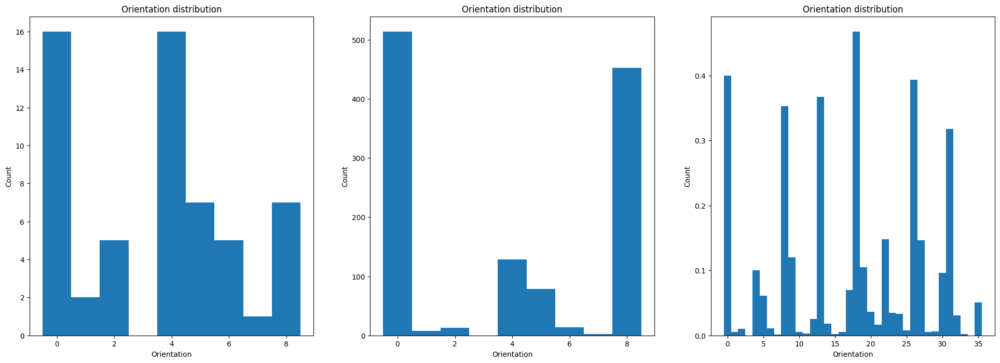

In [48]:
# Compute feature vector
feature_vector = BlockNormalizationAndFeatureConcatenation(weightedHistograms, img_gray.shape, CELL_SIZE)
# Plot
fig, ax = plt.subplots(1, 3, figsize=(24, 8))

ax[0].bar(np.arange(histograms[0].shape[0]), histograms[0].reshape(-1), width=1)
ax[0].set_xlabel('Orientation')
ax[0].set_ylabel('Count')
ax[0].set_title('Orientation distribution')

ax[1].bar(np.arange(weightedHistograms[0].shape[0]), weightedHistograms[0].reshape(-1), width=1)
ax[1].set_xlabel('Orientation')
ax[1].set_ylabel('Count')
ax[1].set_title('Orientation distribution')

ax[2].bar(np.arange(feature_vector[0].shape[0]), feature_vector[0].reshape(-1), width=1)
ax[2].set_xlabel('Orientation')
ax[2].set_ylabel('Count')
ax[2].set_title('Orientation distribution')


plt.show()

**Note :** the feature vector given by the function is not a 1D array since it is needed for the visualization provided that it returns the list of the histograms of the blocks. We concatenate it later so we still do the visualization of the features on the 1D feature vector as expected later.

In [49]:
feature_vector = np.concatenate(feature_vector)

### 1.3.7 Feature Vector Visualization

The final descriptor is then a 1-dimentional array with the concatenation of the blocks normalized histograms. However, this shouldn't prevent us from having an intuitive visualization of the computed features. 

**QUESTION:**(/5)

As last exercise, you need to display the feature vector over the image space (or any clever way).

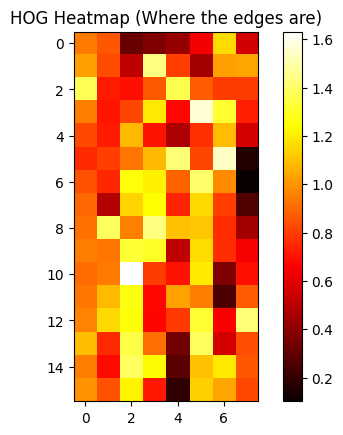

In [50]:
# YOUR CODE HERE
def get_cells_hist(feature_vector, img_size, cell_size, NB_BLOCK_CELLS_X = 2, NB_BLOCK_CELLS_Y = 2):
    y_cells = img_size[0] // cell_size
    x_cells = img_size[1] // cell_size
    y_blocks = y_cells - 1
    x_blocks = x_cells - 1
    
    cells_per_block = NB_BLOCK_CELLS_X * NB_BLOCK_CELLS_Y
    num_bins = len(feature_vector) // (y_blocks * x_blocks * cells_per_block)
    
    cells_hist = np.zeros((y_cells, x_cells, num_bins))
    cell_count = np.zeros((y_cells, x_cells))
    
    # Pointer to move through the 1D feature_vector
    current_pos = 0
    block_size = cells_per_block * num_bins

    for i in range(y_blocks):
        for j in range(x_blocks):
            #Extract the chunk for the current block
            block_1d = feature_vector[current_pos : current_pos + block_size]
            
            #Reshape into (2, 2, 9)
            block_reshaped = block_1d.reshape(NB_BLOCK_CELLS_Y, NB_BLOCK_CELLS_X, num_bins)
            
            #Add to the spatial grid
            cells_hist[i:i+2, j:j+2, :] += block_reshaped
            cell_count[i:i+2, j:j+2] += 1
            
            #Move the pointer forward
            current_pos += block_size
            
    cell_count = np.maximum(cell_count, 1)

    #Divide each 9-bin histogram by the number of blocks that contributed to it
    #We use [:, :, np.newaxis] to make cell_count (16, 8) compatible with cells_hist (16, 8, 9)
    cells_hist = cells_hist / cell_count[:, :, np.newaxis]
    
    return cells_hist
    

cells_hist =  get_cells_hist(feature_vector, img_gray.shape, CELL_SIZE)

# Sum all 9 bins to get one "intensity" value per cell
hog_energy = np.sum(cells_hist, axis=-1)
plt.imshow(hog_energy, cmap='hot')
plt.title("HOG Heatmap (Where the edges are)")
plt.colorbar()
plt.show()

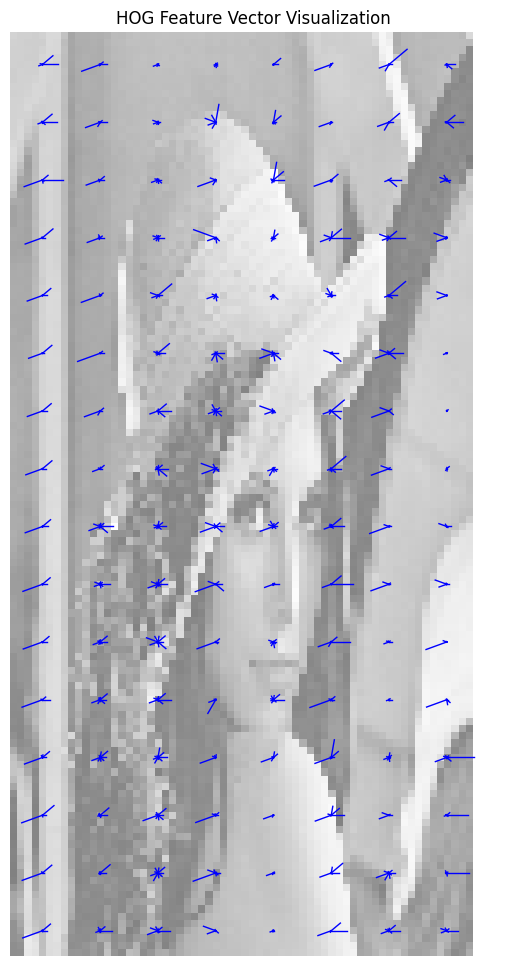

In [51]:
#Visualize the features over the image
def display_hog_over_image(img, cells_hist, cell_size=8):
    """
    Displays the HOG feature vector as orientation rosettes 
    overlaid on the original image.
    """
    #Setup the figure
    fig, ax = plt.subplots(figsize=(8, 12))
    ax.imshow(img, cmap='gray', alpha=0.5)  # Faded background
    
    y_cells, x_cells, num_bins = cells_hist.shape
    
    #Map bin indices to angles (0 to 360 degrees)
    #HOG bins represent angles from 0 to 2pi
    angles = np.linspace(0, 2*np.pi, num_bins, endpoint=False)
    
    #Scale factor to prevent the lines from overlapping too much
    scale = cell_size / 1.5

    # 3. Iterate through every cell
    for i in range(y_cells):
        for j in range(x_cells):
            # Center of the cell in pixel space
            cx = j * cell_size + cell_size / 2
            cy = i * cell_size + cell_size / 2
            
            # Draw each bin as a line segment
            for b in range(num_bins):
                mag = cells_hist[i, j, b]
                angle = angles[b]
                
                # Trigonometry: Calculate offsets from center
                # We draw the line in both directions (+ and -) from the center
                dx = mag * scale * np.cos(angle)
                dy = mag * scale * np.sin(angle)
                ax.plot([cx, cx + dx], [cy, cy + dy], 
                        color='blue', linewidth=1)

    ax.set_title("HOG Feature Vector Visualization")
    ax.axis('off')
    plt.show()

display_hog_over_image(img_gray, cells_hist, CELL_SIZE)

This visualization maps the **1D HOG feature vector** back into the 2D image space to provide an intuitive understanding of the computed features.

How to read this image:
* **The "Stars":** Each blue "star" represents a small 8x8 pixel neighborhood (a cell). 
* **Direction (Orientation):** The angle of each blue line shows the dominant direction of the edges in that cell. Because we used a 0°-360° calculation, these lines point exactly where the image changes from dark to light.
* **Length (Magnitude):** Longer lines mean the edge is very sharp. Smaller lines appear in blurry areas or places with very little detail.

### 1.3.8 HOG in action

As you may suspect already, OpenCV comes with a nice implementation of the HOG descriptor. Once you finish this notebook, you should be able to understand the basic parameters from the `cv.HOGDescriptor()` class.

In the next cell, we use a simple Support Vector Machine algoritmh (SVM) to detect People in multi-scale images.

Image has dimensions: (640, 480, 3)


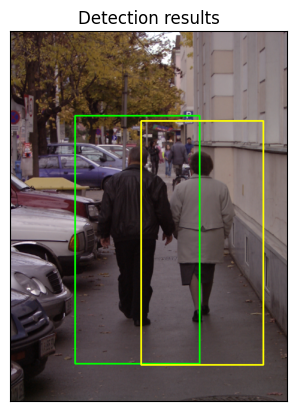

In [ ]:
# initialize the HOG descriptor/person detector
hog = cv.HOGDescriptor()
hog.setSVMDetector(cv.HOGDescriptor_getDefaultPeopleDetector())

# load base image (check that we are not scaling, normalizing or changing the channels)
img = cv.imread(os.path.join('data', 'person_104.bmp'))
print('Image has dimensions: {}'.format(img.shape))

# The HOG detector returns an array with the Regions of maximum likehood to contain a human-shaped-form
rects, weights = hog.detectMultiScale(img, winStride=(4, 4), padding=(8, 8), scale=1.05)

# draw the original bounding boxes
persons = 0
for (x, y, w, h) in rects:
    cv.rectangle(img, (x, y), (x + w, y + h), (0, 255, persons * 256), 2)
    persons += 1
    
display_image(img)
plt.title('Detection results')
plt.xticks([])
plt.yticks([])

Image has dimensions: (480, 640, 3)


([], [])

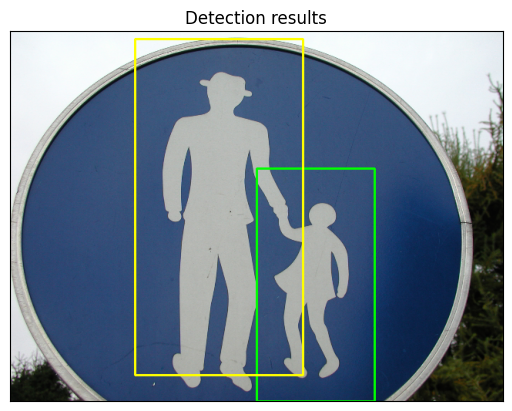

In [53]:
# load base image
img = cv.imread(os.path.join('data', 'person_454.bmp'))
print('Image has dimensions: {}'.format(img.shape))

# The HOG detector returns an array with the Regions of maximum likehood to contain a human-shaped-form
rects, weights = hog.detectMultiScale(img , winStride=(4, 4), padding=(8, 8), scale=1.05)

# draw the original bounding boxes
persons = 0
for (x, y, w, h) in rects:
    cv.rectangle(img , (x, y), (x + w, y + h), (0, 255, persons * 256), 2)
    persons += 1
    
display_image(img)
plt.title('Detection results')
plt.xticks([])
plt.yticks([])

### 1.3.9 References

https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients

https://www.learnopencv.com/histogram-of-oriented-gradients/

http://juliaimages.github.io/ImageFeatures.jl/latest/tutorials/object_detection.html

https://www.learnopencv.com/tag/hog/